##### Copyright 2020 The TensorFlow Probability Authors.


In [0]:
#@title ##### Licensed under the Apache License, Version 2.0 (the "License"); { display-mode: "form" }
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

## Probabilistic photometric redshift estimation using TFP

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/probability/blob/main/discussion/examples/Probabilistic_photometric_redshift_estimation_in_TFP.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/probability/blob/main/discussion/examples/Probabilistic_photometric_redshift_estimation_in_TFP.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
  </td>
</table>

## Preliminaries

In [2]:
#@title Imports / installs.
# Drop preinstalled production pkgs to avoid spurious warnings about versions.
!pip uninstall -y -q tensorflow tensorflow-probability fancyimpute
# Install nightly TF/TFP.
!pip install -q --upgrade tf-nightly==2.2.0.dev20200302 tfp-nightly==0.10.0.dev20200302
import pandas as pd
import numpy as np
import tensorflow as tf
import tensorflow_probability as tfp
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
tfb = tfp.bijectors
tfd = tfp.distributions
assert '2.2.0' in tf.__version__, tf.__version__
assert '0.10.0' in tfp.__version__, tfp.__version__

     |████████████████████████████████| 515.7MB 28kB/s 
     |████████████████████████████████| 3.5MB 60.1MB/s 
     |████████████████████████████████| 2.9MB 37.7MB/s 
     |████████████████████████████████| 2.8MB 48.3MB/s 
     |████████████████████████████████| 460kB 61.8MB/s 
     |████████████████████████████████| 778kB 49.5MB/s 
ERROR: tensor2tensor 1.14.1 requires bz2file, which is not installed.
ERROR: tensor2tensor 1.14.1 requires gevent, which is not installed.
ERROR: tensor2tensor 1.14.1 requires gunicorn, which is not installed.
ERROR: tensor2tensor 1.14.1 requires kfac, which is not installed.
ERROR: tensor2tensor 1.14.1 requires mesh-tensorflow, which is not installed.
ERROR: tensor2tensor 1.14.1 requires pypng, which is not installed.
ERROR: tensor2tensor 1.14.1 requires tensorflow-datasets, which is not installed.
ERROR: tensor2tensor 1.14.1 requires tensorflow-gan, which is not installed.
ERROR: tensor2tensor 1.14.1 has requirement tensorflow-probability==0.7.0, but you

## First, let's get some data loaded.

Data is described in [On the realistic validation of photometric redshifts, or why Teddy will never be Happy](https://arxiv.org/abs/1701.08748), by Beck et al.

What do we know about the data? The broadband filter values `u`, `g`, `r`, `i`, `z` are magnitudes (`log(flux)`); flux is known to be roughly Gaussian in distribution.

The errors reported (`uErr`, etc.) can roughly be interpreted as `log(std(flux))`. These are computed from observational data when merging multiple observations.

Typical usage considers relative magnitudes, i.e. `log(flux ratio)` between neighboring filters, e.g. `u-g`, `g-r`, `r-i`, and `i-z`. (See for example, Figure 2 of [link](https://arxiv.org/pdf/1810.00001.pdf).)

The data from Teddy is all of consistent quality, with `teddy_B` being an in-distribution validation set for `teddy_A`. `teddy_C` is a same-coverage sample with different marginal feature distributions, and `teddy_D` is a full-coverage sample from the wide coverage set.

The Happy data has higher quality in the training data than in the validation and test sets. In Happy, redshift is drawn from multiple telescope sources, while features are still drawn from SDSS. Similar to Teddy, `happy_B` is an
in-distribution validation set for `happy_A`. `happy_C` matches photometric error range of `happy_A` and `happy_B`, but with a distribution corresponding to the SDSS-DR12 photometric sample (as opposed to the spectroscopic data). `happy_D` is sourced from the same distribution as `happy_C`, but no longer constrained to match the photometric error range of `happy_[AB]`.

In [3]:
#@title Load data from teddy

teddies = {}

def load_teddy(dataset):
  if dataset not in teddies:
    cols = pd.read_csv('https://github.com/COINtoolbox/photoz_catalogues/raw/master/Teddy/forTemplateBased/columns.txt')
    teddies[dataset] = pd.read_csv(
        f'https://github.com/COINtoolbox/photoz_catalogues/raw/master/Teddy/forTemplateBased/teddyT_{dataset}.cat', 
        header=None, sep='\t', skipinitialspace=True, comment='#', names=cols.columns, index_col='ID')
  return teddies[dataset]

for ds in 'ABCD':
  df = load_teddy(dataset=ds)
  print(ds,'\ncols:', df.columns, '\n', df)


A 
cols: Index(['u', 'g', 'r', 'i', 'z', 'uErr', 'gErr', 'rErr', 'iErr', 'zErr',
       'redshift', 'redshiftErr'],
      dtype='object') 
                              u          g  ...  redshift  redshiftErr
ID                                         ...                       
1237645942905110768  22.373924  20.301023  ...  0.309728     0.000043
1237645942905569773  22.497066  20.952272  ...  0.336479     0.000101
1237645943978328381  22.678976  21.650578  ...  0.406500     0.000184
1237645943978524819  21.032383  18.865986  ...  0.192485     0.000034
1237645943978524889  21.576267  20.216810  ...  0.319904     0.000094
...                        ...        ...  ...       ...          ...
1237680531354026438  20.724480  19.423906  ...  0.261464     0.000040
1237680531354878404  20.440622  18.997736  ...  0.223003     0.000031
1237680531355009174  23.488087  21.739256  ...  0.478527     0.000056
1237680531355795869  21.089705  19.609488  ...  0.274434     0.000043
1237680531356254710 

In [4]:
#@title Load data from happy
import pandas as pd

happies = {}

def load_happy(dataset):
  if dataset not in happies:
    df = pd.read_csv(f'https://raw.githubusercontent.com/COINtoolbox/photoz_catalogues/master/Happy/forTemplateBased/happyT_{dataset}', 
                    header=0, sep=' ', skipinitialspace=True, index_col='#')
    df.index.name='ID'
    for i in range(1, len(df.columns)):
      df[df.columns[-i]] = df[df.columns[-(i+1)]]
    del df['id']
    happies[dataset] = df
  return happies[dataset]

for ds in 'ABCD':
  df = load_happy(dataset=ds)
  print(ds, '\ncols:', df.columns, '\n', df)

A 
cols: Index(['u', 'g', 'r', 'i', 'z', 'uErr', 'gErr', 'rErr', 'iErr', 'zErr',
       'redshift', 'redshiftErr'],
      dtype='object') 
                              u          g  ...  redshift  redshiftErr
ID                                         ...                       
1237645879562928805  25.155375  22.232981  ...  0.752707     0.000287
1237645942905504040  21.910667  19.464439  ...  0.164360     0.000066
1237645942905635180  20.978670  20.276821  ...  0.326150     0.000011
1237645942906224860  20.389980  19.313643  ...  0.274926     0.000063
1237645943978721520  23.907169  23.448675  ...  0.592983     0.000148
...                        ...        ...  ...       ...          ...
1237679322861732081  22.791651  22.070421  ...  0.452897     0.004359
1237679323396702741  23.020573  22.457899  ...  0.672500     0.000787
1237679323397947831  21.849312  21.455599  ...  0.509282     0.004528
1237679323398078948  26.250772  21.630043  ...  0.324284     0.003973
1237679439888056986 

In [0]:
def mk_feats(df):
  return tf.stack([np.float64(col) for col in
                   (df.r, df.u - df.g, df.g - df.r, df.r - df.i, df.i - df.z)],
                  axis=-1)

## Basics: Use keras to train a vanilla NN on the data

### Train a NN

In [6]:
df = load_teddy('A')
# df = load_happy('A')
feats = mk_feats(df)
labels = tf.constant(np.float64(df.redshift))

mean_feat = tf.reduce_mean(feats, axis=0, keepdims=True)
std_feat = tf.math.reduce_std(feats, axis=0, keepdims=True)
norm_feats = lambda feats: (feats - mean_feat) / std_feat
feats = norm_feats(feats)

tf.keras.backend.set_floatx('float64')
inputs = tf.keras.Input((feats.shape[-1],))
m = tf.keras.layers.Dense(64, activation='tanh')(inputs)
m = m + tf.keras.layers.Dense(64, activation='tanh')(m)
m = m + tf.keras.layers.Dense(64, activation='tanh')(m)
m = tf.keras.layers.Dense(1, activation=lambda x: tf.nn.softplus(x[..., 0]))(m)
nn = tf.keras.Model(inputs, m)

opt = tf.optimizers.Adam(.001)
nn.compile(opt, loss='mse', metrics=['mse', 'mape'])

ds = tf.data.Dataset.from_tensor_slices((feats, labels)).shuffle(len(df)).batch(4096)
nn.fit(ds, epochs=20, verbose=1);

Epoch 1/20
19/19 [==============================] - 0s 15ms/step - loss: 0.1038 - mse: 0.1038 - mape: 92.3981
Epoch 2/20
19/19 [==============================] - 0s 12ms/step - loss: 0.0099 - mse: 0.0099 - mape: 28.1326
Epoch 3/20
19/19 [==============================] - 0s 12ms/step - loss: 0.0027 - mse: 0.0027 - mape: 11.2483
Epoch 4/20
19/19 [==============================] - 0s 11ms/step - loss: 0.0023 - mse: 0.0023 - mape: 11.0283
Epoch 5/20
19/19 [==============================] - 0s 11ms/step - loss: 0.0020 - mse: 0.0020 - mape: 10.1140
Epoch 6/20
19/19 [==============================] - 0s 11ms/step - loss: 0.0019 - mse: 0.0019 - mape: 9.9821
Epoch 7/20
19/19 [==============================] - 0s 10ms/step - loss: 0.0018 - mse: 0.0018 - mape: 9.6626
Epoch 8/20
19/19 [==============================] - 0s 10ms/step - loss: 0.0017 - mse: 0.0017 - mape: 9.5913
Epoch 9/20
19/19 [==============================] - 0s 10ms/step - loss: 0.0016 - mse: 0.0016 - mape: 9.4385
Epoch 10/20
19

### Visualize the results

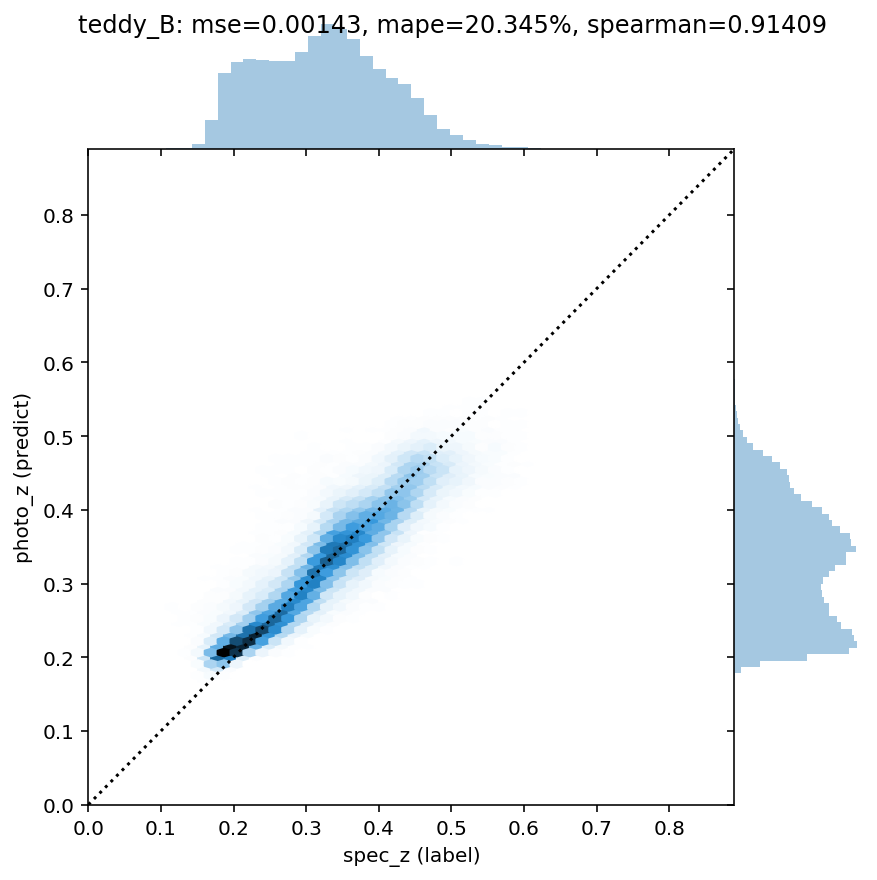

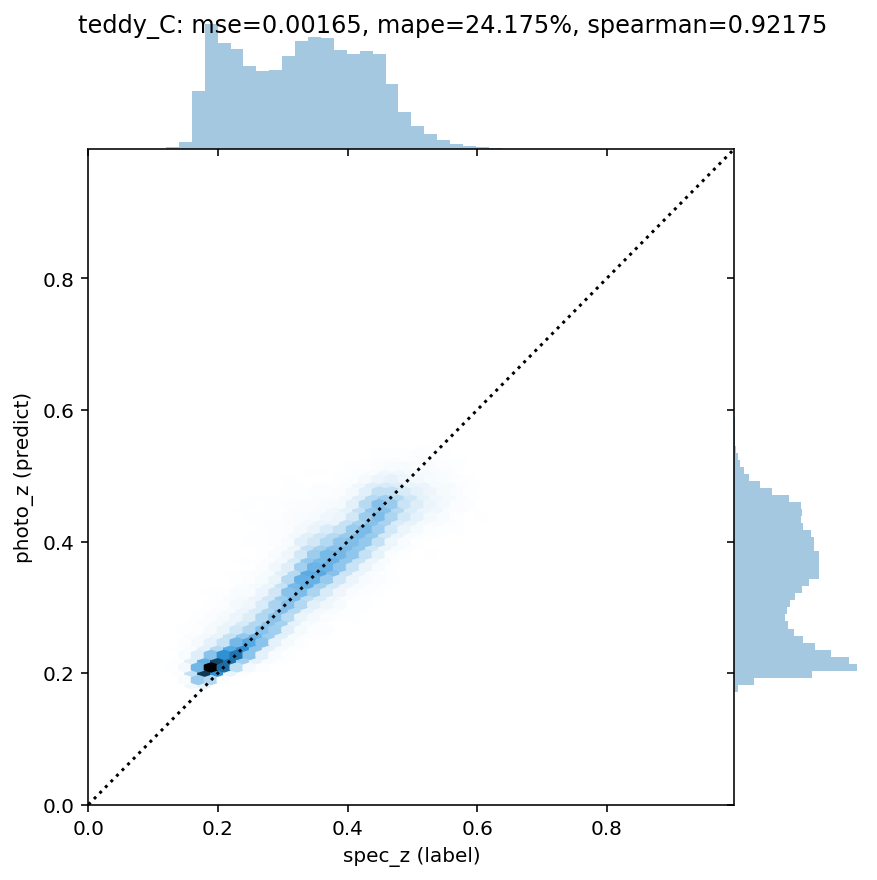

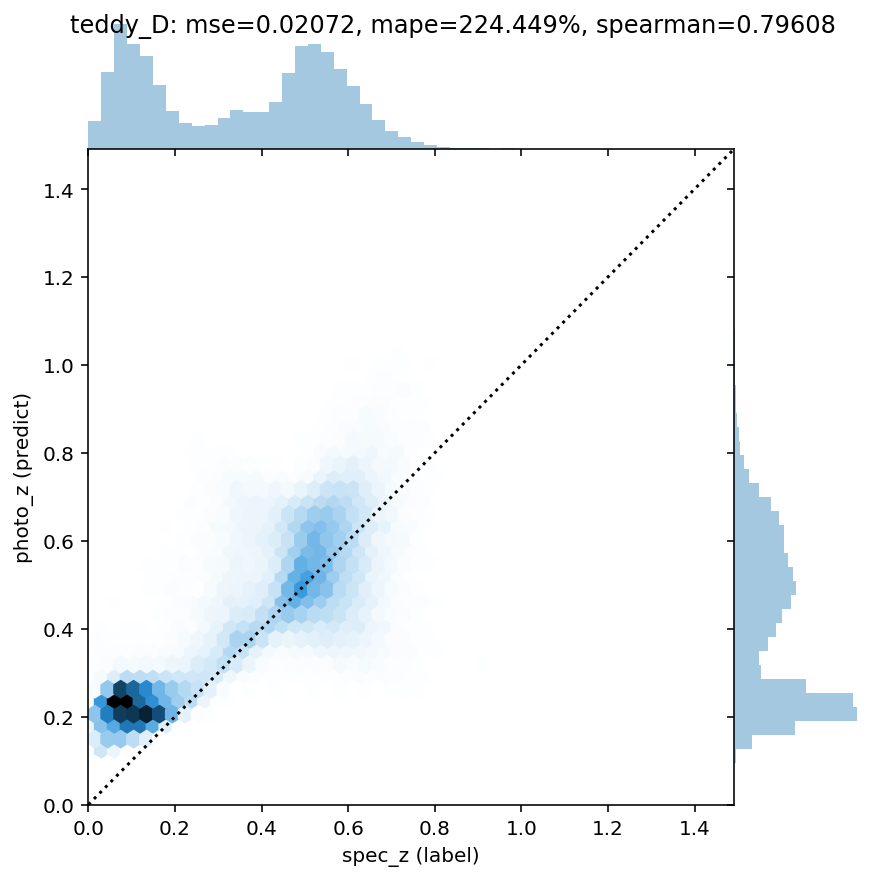

In [7]:
def display_joint(ds, model, n=None, load_fn=load_teddy):
  df = load_fn(ds)
  indices = np.arange(len(df))  
  if n is not None:  # Select a subset
    indices = np.random.choice(len(df), size=n, replace=False) 
  redshift = np.float64(df.redshift)[indices]
  predicted = tf.convert_to_tensor(model(norm_feats(mk_feats(df)))).numpy()[indices]
  lim = 0, redshift.max()
  g = sns.jointplot(redshift, predicted,
                    kind='hex', gridsize=50, space=0, xlim=lim, ylim=lim)
  g.ax_joint.plot(lim, lim, ':k')
  g.fig.suptitle(f'{load_fn.__name__.replace("load_", "")}_{ds}: '
      f'mse={np.round(np.float64(tf.keras.metrics.mse(redshift, predicted)), 5)}, '
      f'mape={np.round(np.float64(tf.keras.metrics.mape(redshift, predicted)), 3)}%, '
      f'spearman={np.round(np.float64(stats.spearmanr(redshift, predicted)[0]), 5)}')
  g.set_axis_labels('spec_z (label)', 'photo_z (predict)')
  plt.show()

for ds in 'BCD':
  display_joint(ds, nn, load_fn=load_teddy)

## Using MSE implies a Gaussian likelihood. Let's try some alternative distributions.

Since we know the data is bounded in [0,5], we might elect to use an alternative likelihood to better incorporate this knowledge. We will add a [`tfp.layers.DistributionLambda`](https://www.tensorflow.org/probability/api_docs/python/tfp/layers/DistributionLambda?version=nightly) layer which uses incoming activations to parameterize:
- a mixture of gaussians ([`tfp.distributions.MixtureSameFamily`](https://www.tensorflow.org/probability/api_docs/python/tfp/distributions/MixtureSameFamily?version=nightly) of [`tfp.distributions.Normal`](https://www.tensorflow.org/probability/api_docs/python/tfp/distributions/Normal?version=nightly)), transformed by a [`tfp.bijectors.Sigmoid`](https://www.tensorflow.org/probability/api_docs/python/tfp/bijectors/Sigmoid?version=nightly) bijector to squeeze into [0, 5], or
- a beta distribution, scaled from [0, 1] to [0, 5] using [`tfp.bijectors.Scale`](https://www.tensorflow.org/probability/api_docs/python/tfp/bijectors/Scale?version=nightly), or
- a beta with mean/sample-size parameterization, or
- a mixture of betas

Note that the training here would still be considered maximum likelihood as we have not explicitly stated a prior over weights or activations.

### Implement new likelihoods for a Neural Density Estimator
These are implemented as functions mapping neural net activations to `tfp.distributions.Distribution` instances.

Let's sample a couple random-normal-parameterized realizations of the distributions these might be capable of producing. i.e. If the neural network were to output random-normal activations, what kinds of distributions might we observe?

likelihood: make_sigmoid_mog


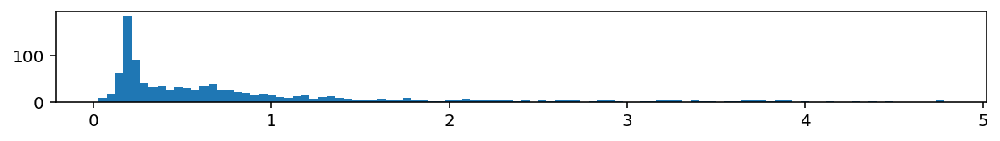

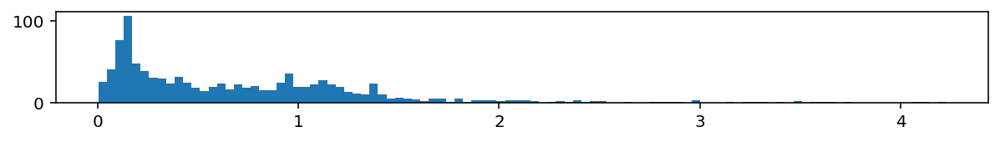

likelihood: make_beta


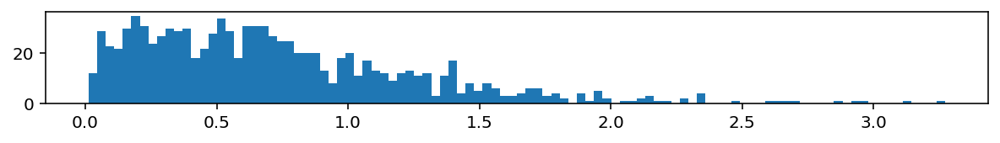

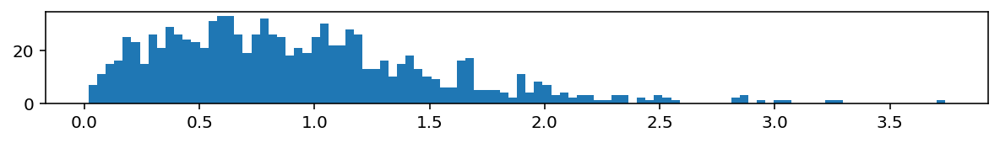

likelihood: make_beta_from_mean_sampsize


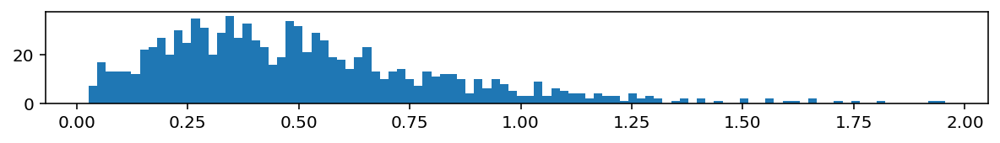

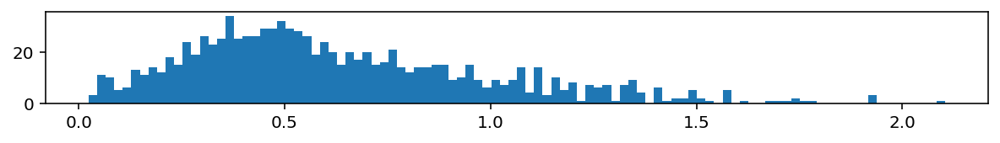

likelihood: make_beta_mixture_from_mean_sampsize


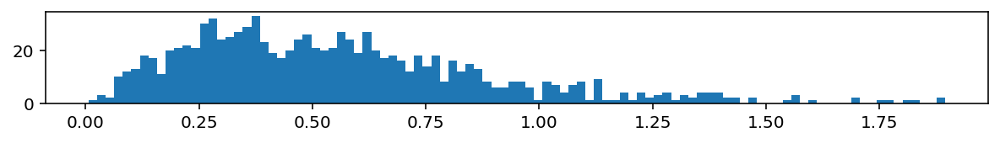

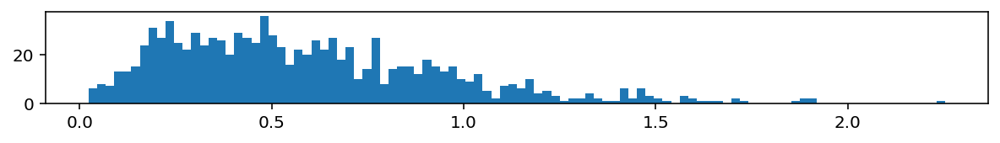

In [8]:
likelihood_options = []

num_mix_components = 8

def make_sigmoid_mog(acts):
  """Sigmoid(mixture of gaussians)"""
  acts = tf.convert_to_tensor(acts)
  dtype = acts.dtype.as_numpy_dtype
  logits, loc, scale = tf.split(acts, 3, axis=-1)
  cat = tfd.Categorical(logits=logits)
  loc = loc - 1.  # Downshift the loc to encourage more mass at the low end.
  norm = tfd.Normal(loc=loc - 1., scale=tf.math.softplus(scale) + .001)
  mixture = tfd.MixtureSameFamily(mixture_distribution=cat,
                                  components_distribution=norm, 
                                  reparameterize=True)
  return tfb.Sigmoid(low=dtype(0), high=dtype(5))(mixture)
setattr(make_sigmoid_mog, 'num_activations', num_mix_components * 3)
likelihood_options.append(make_sigmoid_mog)


def make_beta(acts, squeeze=True):
  acts = tf.convert_to_tensor(acts)
  dtype = acts.dtype.as_numpy_dtype
  conc1, conc0 = tf.split(acts, 2, axis=-1)
  if squeeze:
    conc1 = tf.squeeze(conc1, axis=-1)
    conc0 = tf.squeeze(conc0, axis=-1)
  beta = tfd.Beta(concentration1=tf.math.softplus(conc1) + 1.,
                  concentration0=tf.math.softplus(conc0) + 8.)
  return tfb.Scale(dtype(5))(beta)
setattr(make_beta, 'num_activations', 2)
likelihood_options.append(make_beta)


def make_beta_from_mean_sampsize(acts, squeeze=True):
  acts = tf.convert_to_tensor(acts)
  dtype = acts.dtype.as_numpy_dtype
  mean, sample_size = tf.split(acts, 2, axis=-1)
  if squeeze:
    mean = tf.squeeze(mean, axis=-1)
    sample_size = tf.squeeze(sample_size, axis=-1)
  mean = tf.math.sigmoid(mean * .1 - 2)
  sample_size = tf.math.softplus(sample_size) + 20
  beta = tfd.Beta(concentration1=mean*sample_size, 
                  concentration0=(1-mean)*sample_size)
  return tfb.Scale(dtype(5))(beta)
setattr(make_beta_from_mean_sampsize, 'num_activations', 2)
likelihood_options.append(make_beta_from_mean_sampsize)


def make_beta_mixture_from_mean_sampsize(acts):
  acts = tf.convert_to_tensor(acts)
  dtype = acts.dtype.as_numpy_dtype
  logits, c1, c0 = tf.split(acts, 3, axis=-1)
  cat = tfd.Categorical(logits=logits)
  beta = make_beta_from_mean_sampsize(tf.concat([c1, c0], axis=-1), squeeze=False)
  mixture = tfd.MixtureSameFamily(mixture_distribution=cat,
                                  components_distribution=beta, 
                                  reparameterize=False)  # Bug here?
  return mixture
setattr(make_beta_mixture_from_mean_sampsize, 'num_activations', num_mix_components * 3)
likelihood_options.append(make_beta_mixture_from_mean_sampsize)


def display_likelihood(lik_fn):
  print(f'likelihood: {lik_fn.__name__}')
  d = lik_fn(tf.random.normal([3, lik_fn.num_activations]))
  assert len(d.event_shape) == 0, f'Only scalar events, please: {d}'
  for i in range(2):
    plt.figure(figsize=(10, 1))
    plt.hist(d.sample(1000)[:, i].numpy(), bins=100)
    plt.show()  


for lik_fn in likelihood_options:
  display_likelihood(lik_fn)

### Do you have an idea for an alternative likelihood?

Try implementing it below!

As an fairly complex example, we provide a [`tfp.bijectors.RationalQuadraticSpline`](https://www.tensorflow.org/probability/api_docs/python/tfp/bijectors/RationalQuadraticSpline?version=nightly)-transformed [`tfp.distributions.Uniform`](https://www.tensorflow.org/probability/api_docs/python/tfp/distributions/Uniform?version=nightly) distribution.

A simpler example: gamma distribution with mean/variance parameterization.


In [0]:
#@title ##### e.g. Spline(Uniform) can offer a very flexible approximating family.
do_it = False #@param {type:"boolean"}
if do_it:
  nbins = 64
  def make_spline(acts):

    def bin_positions(x, range_max=5.):
      min_bin = 1e-4
      return tf.math.softmax(x, axis=-1) * (range_max - nbins * min_bin) + min_bin

    def slopes(x):
      return tf.math.softplus(x) + 1e-3
    
    acts = tf.convert_to_tensor(acts)
    dtype = acts.dtype.as_numpy_dtype
    bw, bh, ks = tf.split(acts, [nbins, nbins, nbins - 1], axis=-1)
    spline = tfb.RationalQuadraticSpline(bin_widths=bin_positions(bw), 
                                        bin_heights=bin_positions(bh),
                                        knot_slopes=slopes(ks),
                                        range_min=dtype(0), 
                                        validate_args=True)
    return spline(tfd.Uniform(low=tf.zeros(tf.shape(bh)[:-1], dtype=dtype),
                              high=dtype(5))).copy(name='SplineUniform')
  setattr(make_spline, 'num_activations', nbins * 3 - 1)
  if make_spline not in likelihood_options:
    likelihood_options.append(make_spline)
  display_likelihood(make_spline)

  def plot_spline(spline):
    kx = spline.range_min + tf.cumsum(spline.bin_widths, axis=-1)
    ky = spline.range_min + tf.cumsum(spline.bin_heights, axis=-1)
    kd = spline.knot_slopes
    min_max = np.array([spline.range_min, kx[..., -1]])
    plt.figure(figsize=(10,2))
    xs = np.linspace(spline.range_min - .1, min_max[1] + .1, 1000)[:,np.newaxis]
    plt.title('spline + inverse')
    plt.scatter(kx[0], ky[0])
    ys = spline.forward(xs)
    plt.plot(xs[:,0], ys[:,0], label='forward')
    plt.scatter(min_max, min_max)
    slx, sly = [], []
    for i in range(len(kx)):
      slx += [kx[0,i] - .05, kx[0,i] + .05, np.nan]
      sly += [ky[0,i] - .05 * kd[0,i], ky[0,i] + .05 * kd[0,i], np.nan]
    plt.plot(slx, sly, '--', color='r')
    # Plot the inverse on the same chart.
    plt.scatter(ky[0], kx[0], color='g')
    ys = spline.inverse(xs)
    plt.plot(xs[:,0], ys[:,0], color='brown', label='inverse')
    plt.scatter(min_max, min_max)
    plt.plot(sly, slx, '--', color='y')
    plt.legend(loc='best')
    plt.show()

  plot_spline(make_spline(tf.random.normal([1, make_spline.num_activations])).bijector)

In [0]:
#@title ##### e.g. gamma from mean/var
do_it = False #@param {type:"boolean"}
if do_it:
  def make_gamma_from_mean_var(acts):
    acts = tf.math.softplus(acts) + .01
    dtype = acts.dtype.as_numpy_dtype
    mean, var = tf.split(acts, 2, axis=-1)
    beta = mean / var
    alpha = mean * beta
    beta = tf.squeeze(beta, axis=-1)
    alpha = tf.squeeze(alpha, axis=-1)
    return tfd.Gamma(concentration=alpha, rate=beta)
  setattr(make_gamma_from_mean_var, 'num_activations', 2)
  if make_gamma_from_mean_var not in likelihood_options:
    likelihood_options.append(make_gamma_from_mean_var)
  display_likelihood(make_gamma_from_mean_var)

To use these as the likelihood for neural network training, we can add a `tfp.layers.DistributionLambda` layer to the end of our Keras model. When such a model is run forward it produces a `tfp.distributions.Distribution`-like object which can also be used directly as a `Tensor` (implicitly sampling the distribution), for consumption by downstream layers or a loss function. Alternatively, it can be used as a `tfp.distributions.Distribution` to compute `prob`, `mean`, etc.

In the `nll` loss function below, we will take the minibatch of labels and the network outputs (a minibatch of distributions), and use the distributions to compute the negative log-likelihood of the labels under the NN-parameterized distributions.

### MLE training with alternative likelihoods

In [11]:
df = load_teddy('A')
# df = load_happy('A')
feats = mk_feats(df)
labels = tf.constant(np.float64(df.redshift))

mean_feat = tf.reduce_mean(feats, axis=0, keepdims=True)
std_feat = tf.math.reduce_std(feats, axis=0, keepdims=True)
norm_feats = lambda feats: (feats - mean_feat) / std_feat
feats = norm_feats(feats)

nn_custom_likelihood = {}

for lik_fn in likelihood_options:
  likelihood_name = lik_fn.__name__
  print(f'likelihood: {likelihood_name}')

  tf.keras.backend.set_floatx('float64')
  inputs = tf.keras.Input((feats.shape[-1],))
  m = tf.keras.layers.Dense(64, activation='tanh')(inputs)
  m = m + tf.keras.layers.Dense(64, activation='tanh')(m)
  m = m + tf.keras.layers.Dense(64, activation='tanh')(m)
  m = tf.keras.layers.Dense(lik_fn.num_activations, activation=None)(m)
  m = tfp.layers.DistributionLambda(lik_fn)(m)
  model = nn_custom_likelihood[likelihood_name] = tf.keras.Model(inputs, m)

  opt = tf.optimizers.Adam(.002)
  def nll(labels, dists):
    return -dists.log_prob(labels[..., 0])
  model.compile(opt, loss=nll, metrics=['mse', 'mape'])

  ds = tf.data.Dataset.from_tensor_slices((feats, labels)).shuffle(len(df)).batch(4096)
  epochs = 50
  model.fit(ds, epochs=epochs, verbose=1)

likelihood: make_sigmoid_mog
Epoch 1/50
19/19 [==============================] - 0s 20ms/step - loss: -0.9555 - mse: 0.2142 - mape: 76.9376
Epoch 2/50
19/19 [==============================] - 0s 16ms/step - loss: -1.6545 - mse: 0.0646 - mape: 32.6810
Epoch 3/50
19/19 [==============================] - 0s 14ms/step - loss: -1.8612 - mse: 0.0285 - mape: 22.3726
Epoch 4/50
19/19 [==============================] - 0s 14ms/step - loss: -1.9793 - mse: 0.0145 - mape: 17.1032
Epoch 5/50
19/19 [==============================] - 0s 14ms/step - loss: -2.0538 - mse: 0.0088 - mape: 14.6484
Epoch 6/50
19/19 [==============================] - 0s 13ms/step - loss: -2.1270 - mse: 0.0058 - mape: 13.0143
Epoch 7/50
19/19 [==============================] - 0s 13ms/step - loss: -2.1645 - mse: 0.0044 - mape: 11.9288
Epoch 8/50
19/19 [==============================] - 0s 14ms/step - loss: -2.1955 - mse: 0.0035 - mape: 11.3529
Epoch 9/50
19/19 [==============================] - 0s 13ms/step - loss: -2.2075 - 

### Visualize the results
That was a lot of training. Let's visualize the performance on some of the validation sets. Since we now have a distribution as the output of our network, we can evaluate the probability of the output sampled from this distribution, and plot labels x predictive-samples color-coded by confidence-in-sample.

make_sigmoid_mog


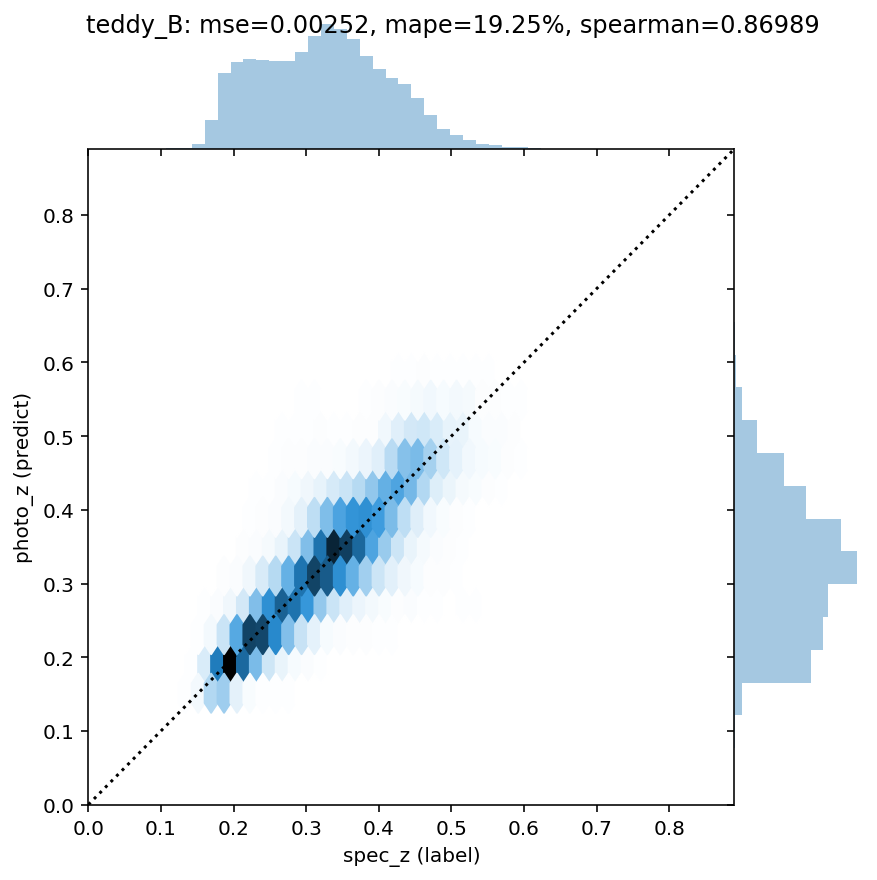

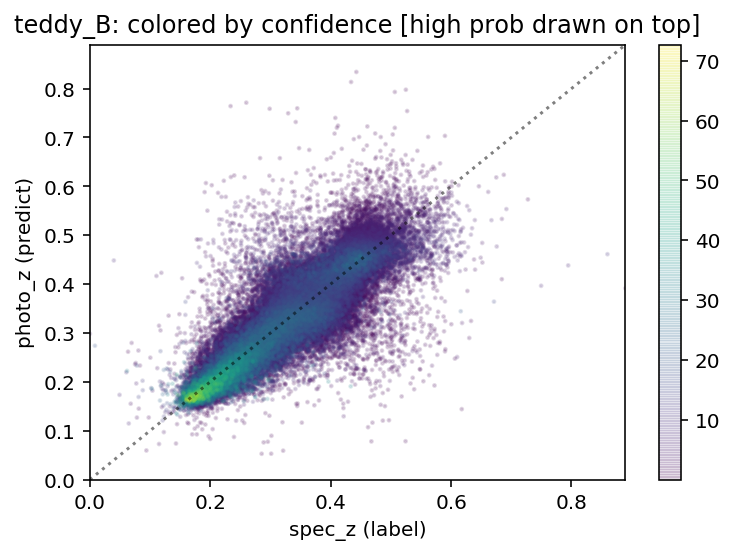

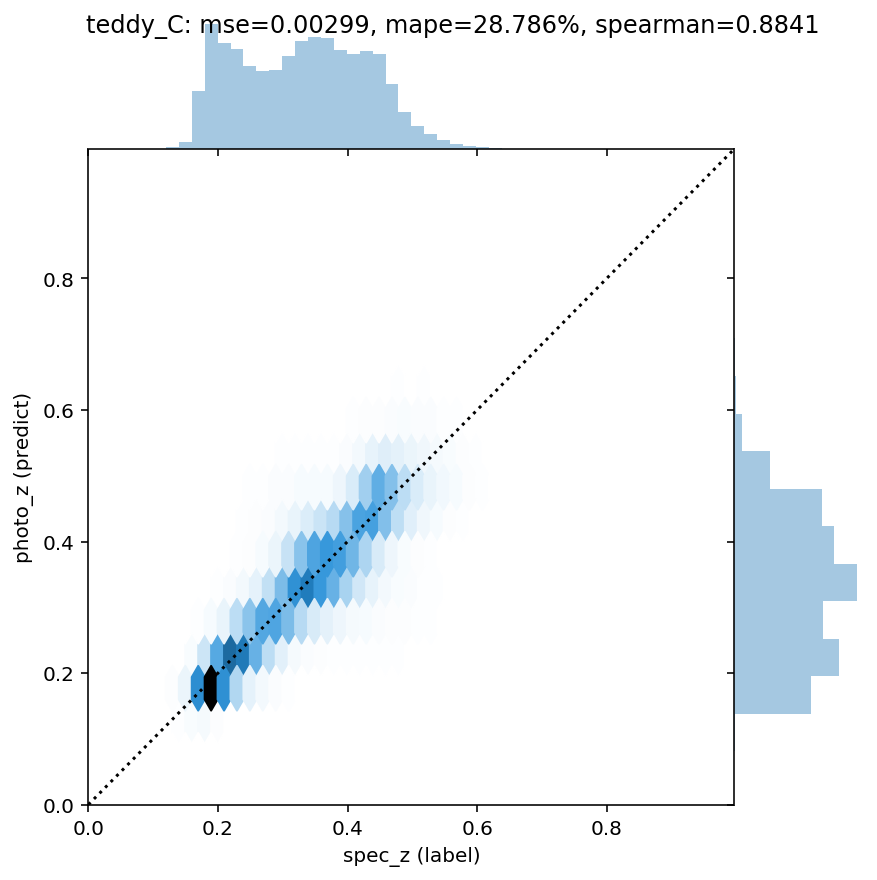

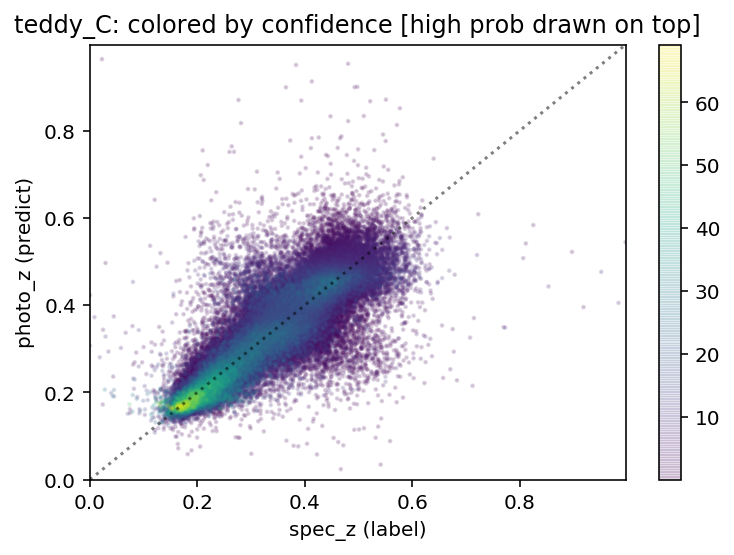

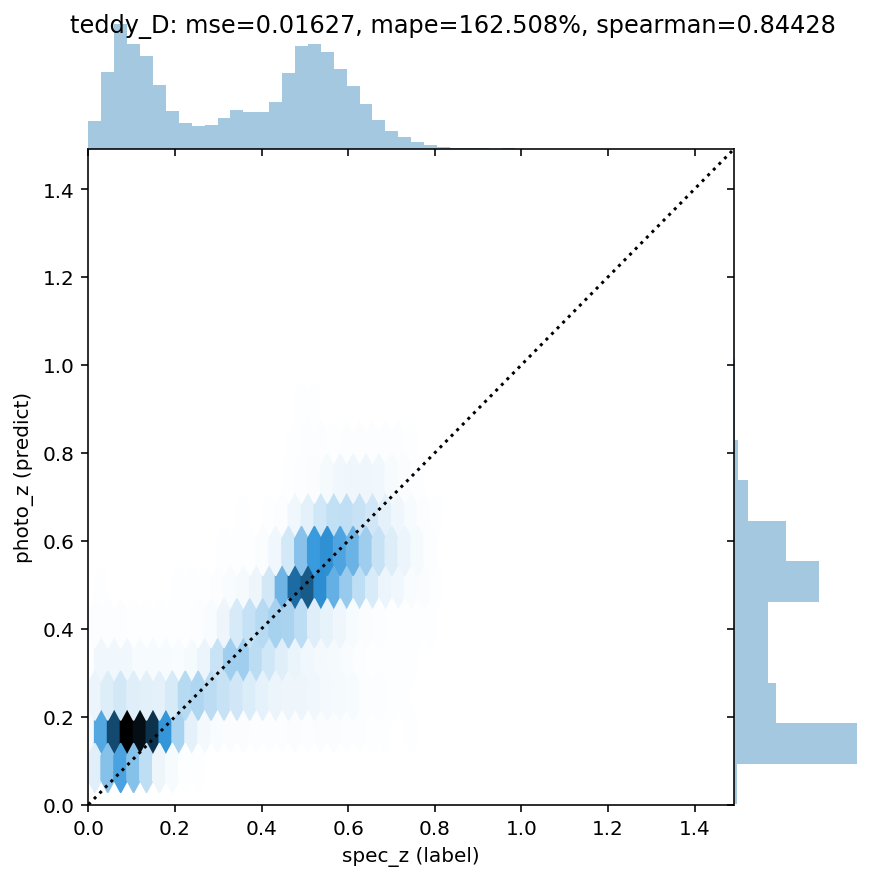

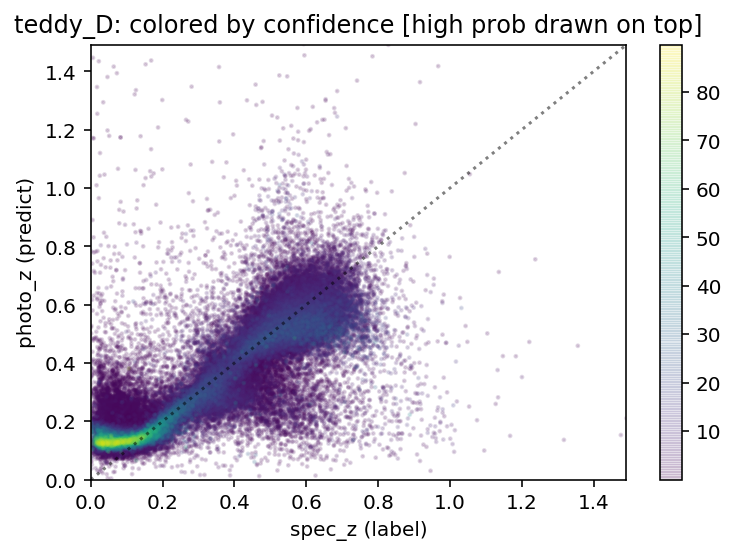

make_beta


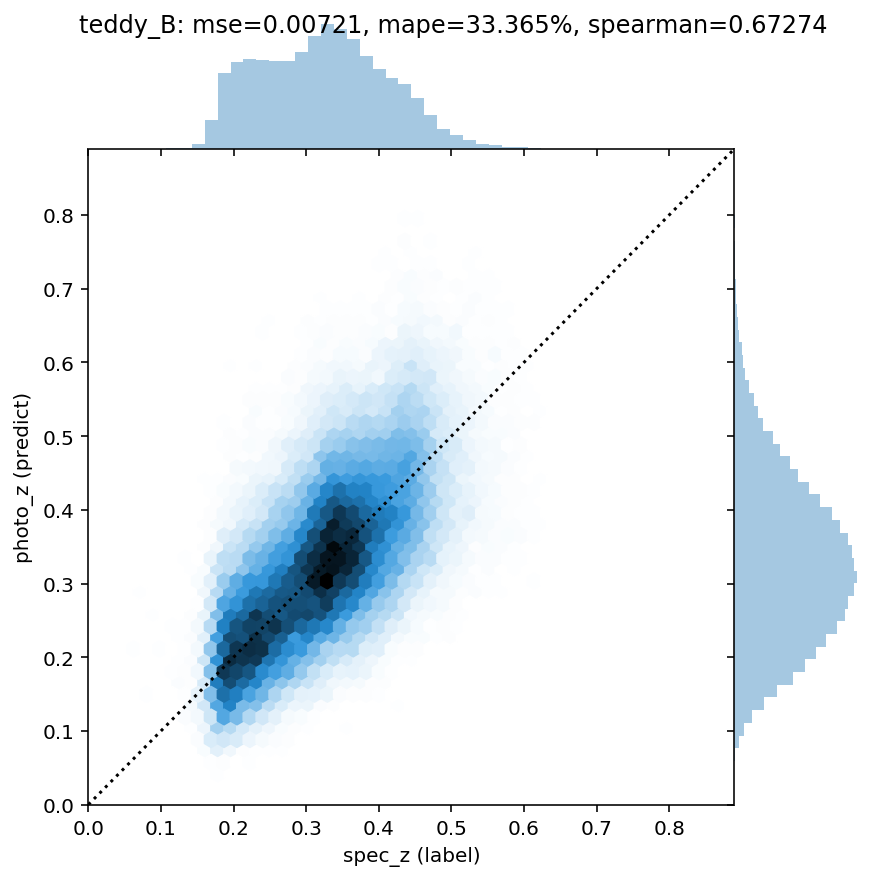

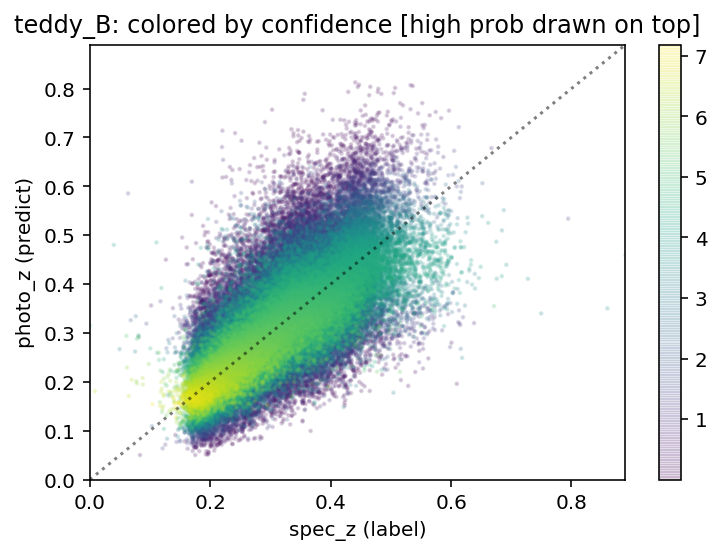

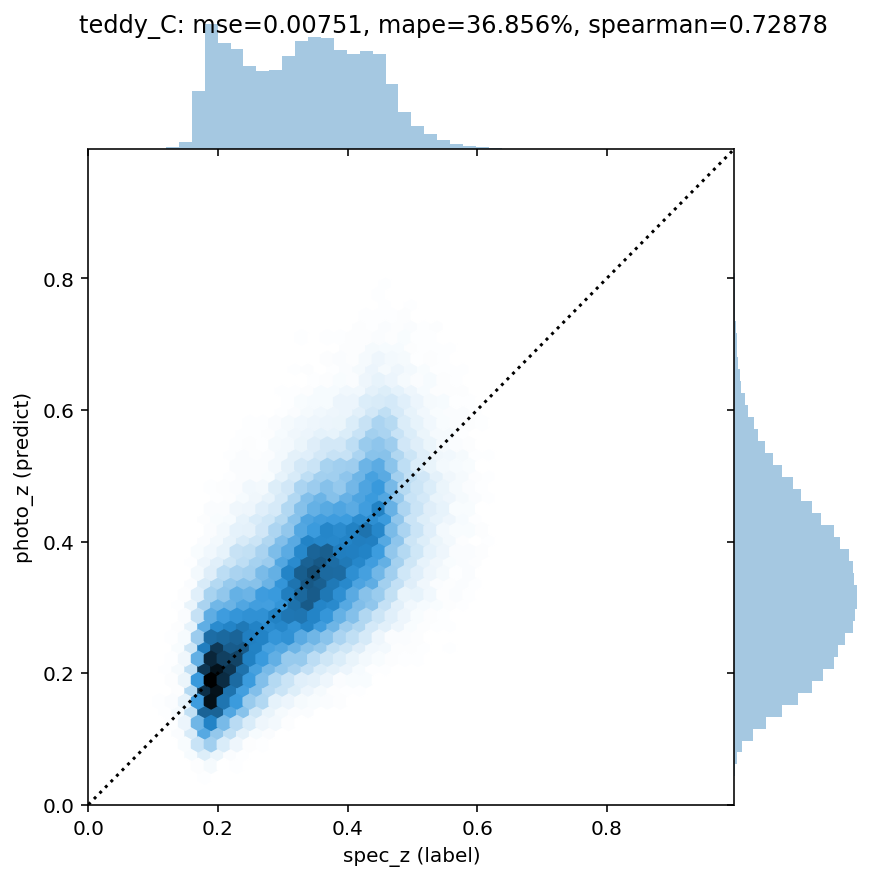

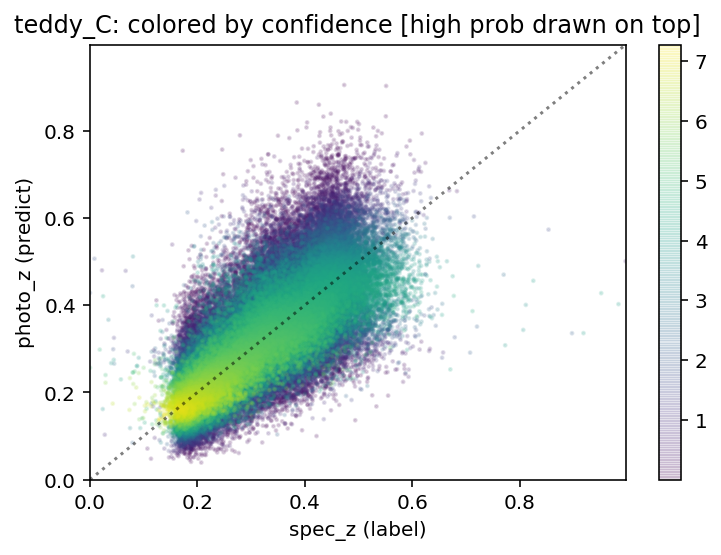

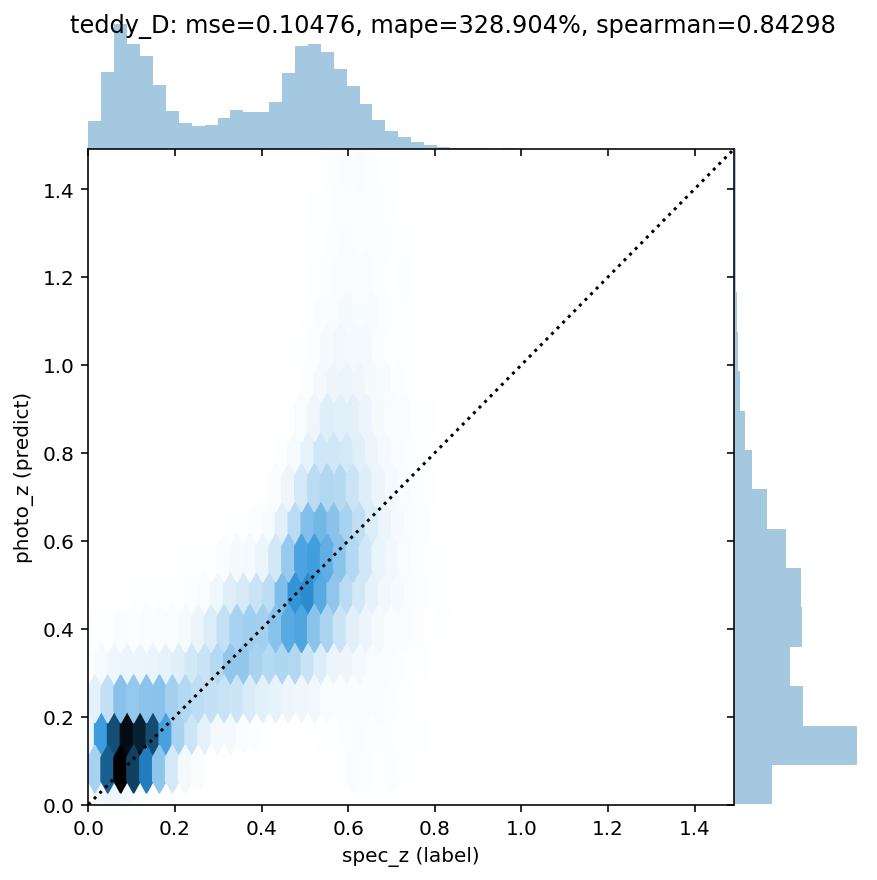

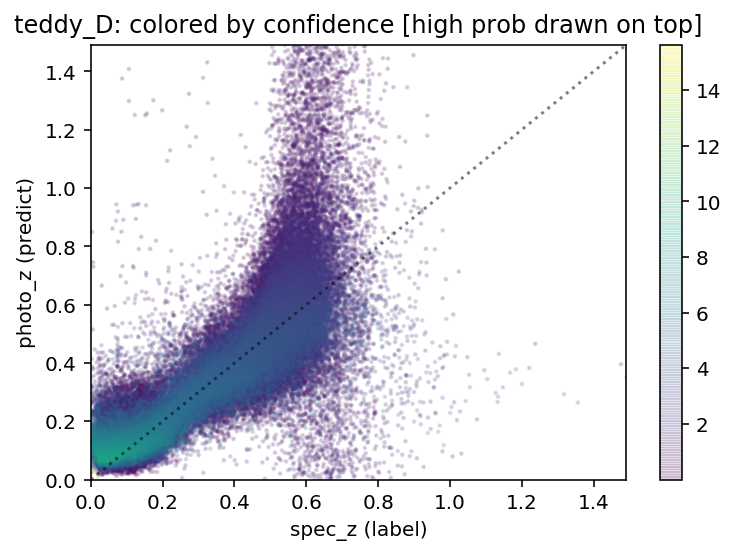

make_beta_from_mean_sampsize


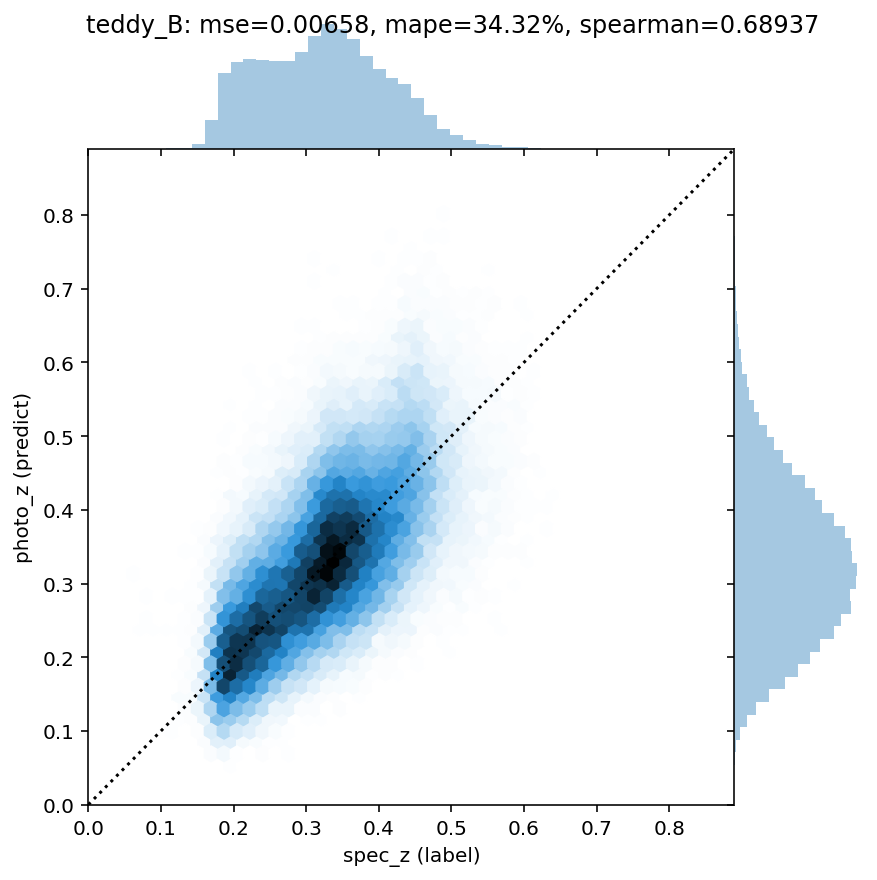

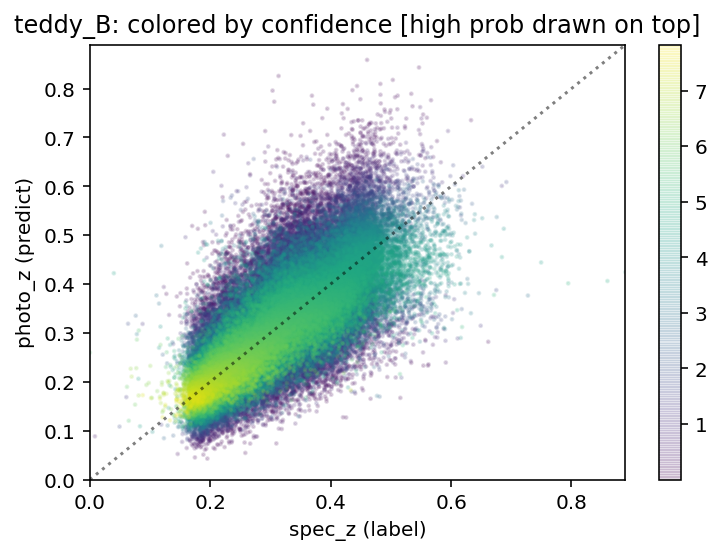

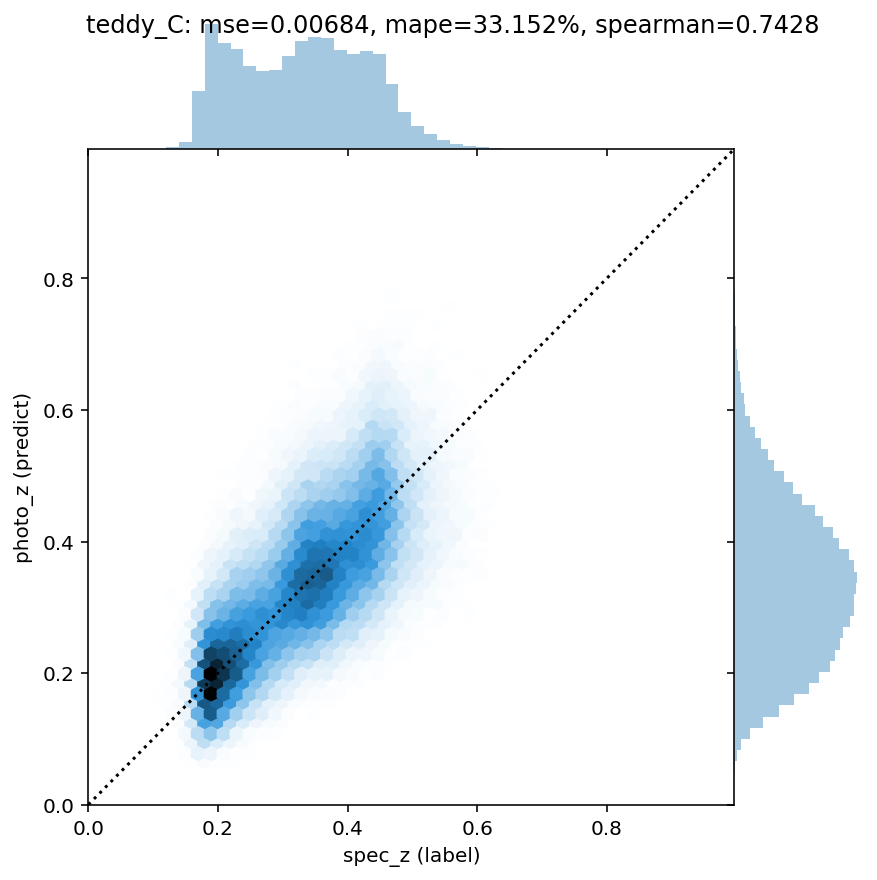

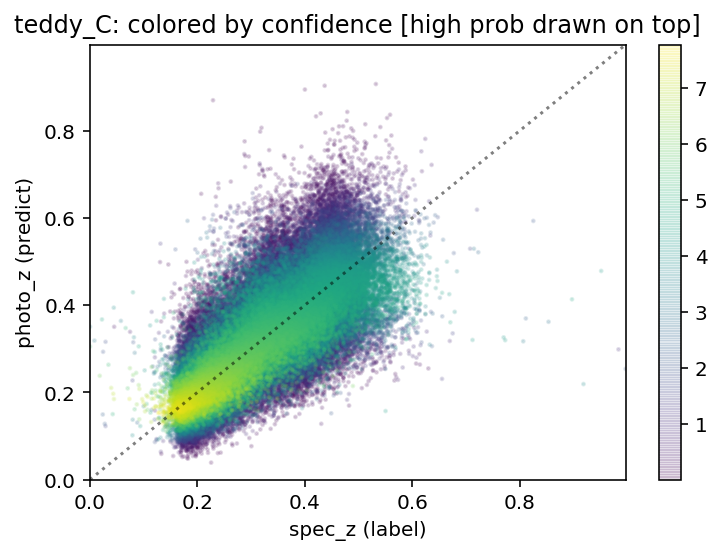

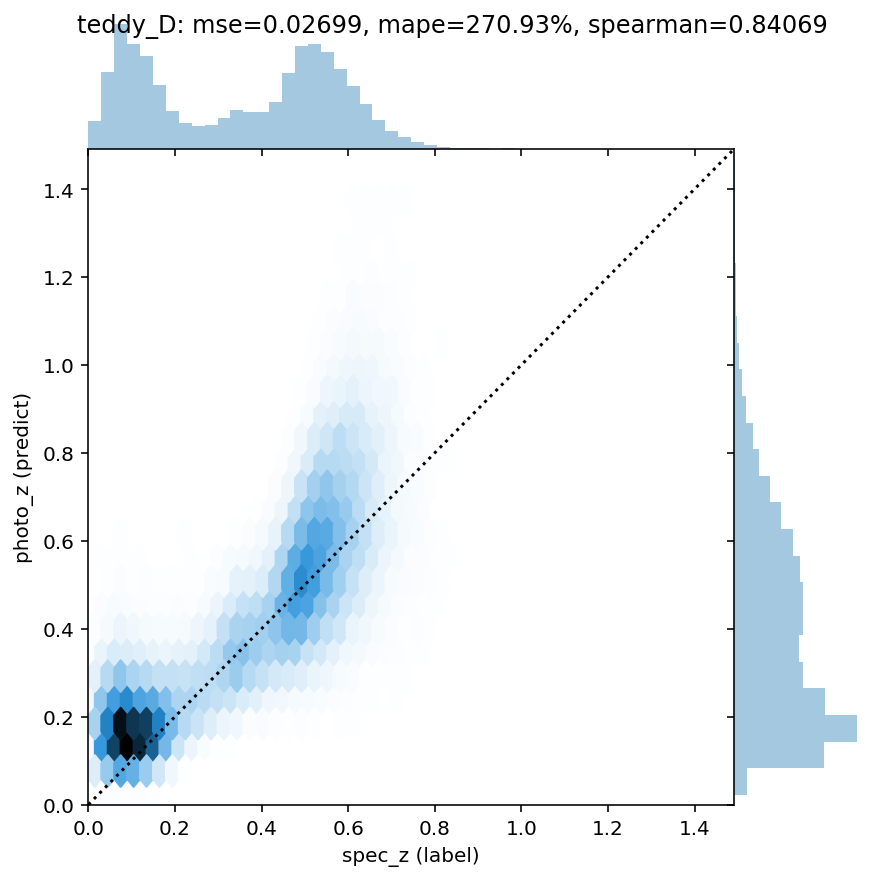

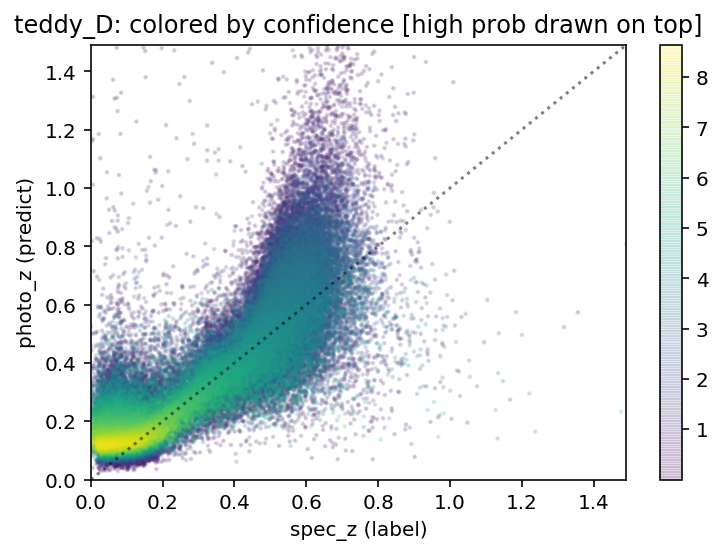

make_beta_mixture_from_mean_sampsize


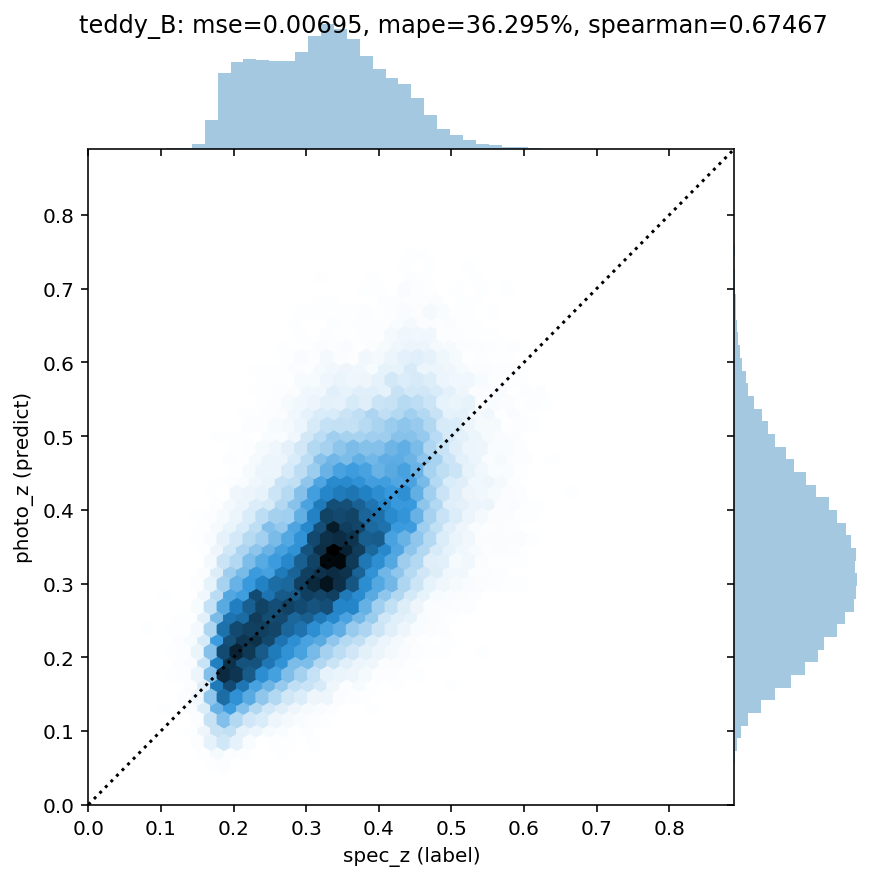

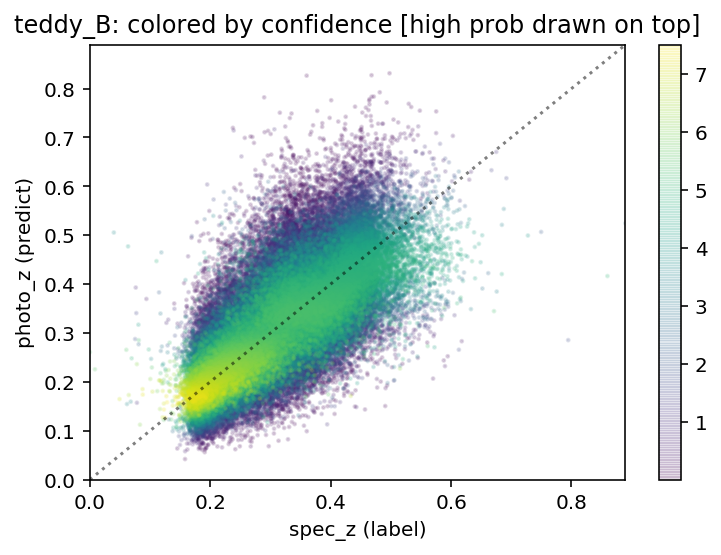

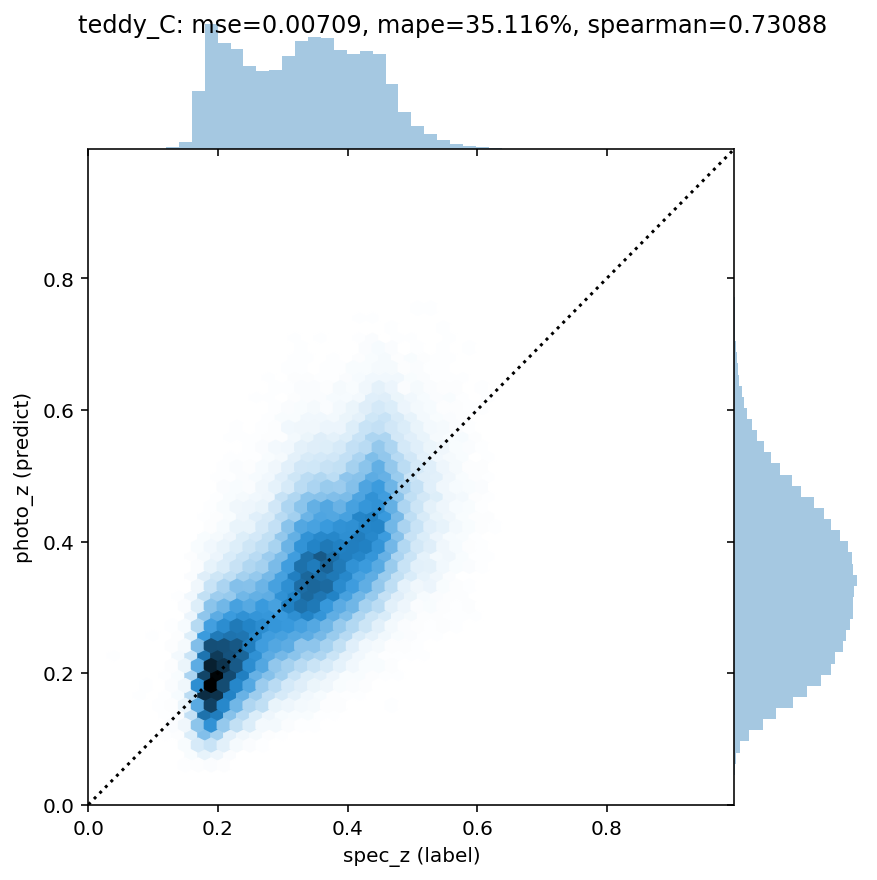

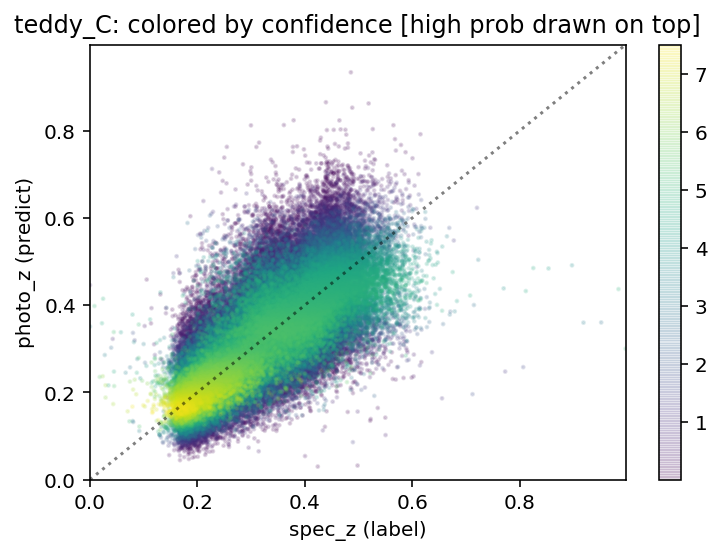

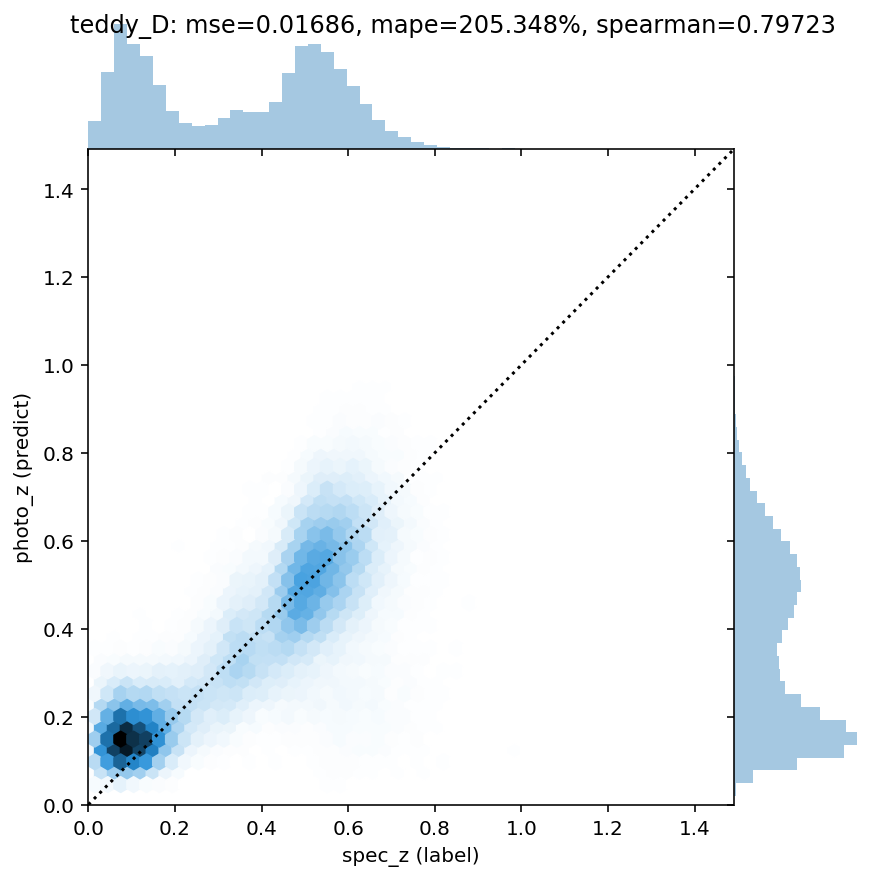

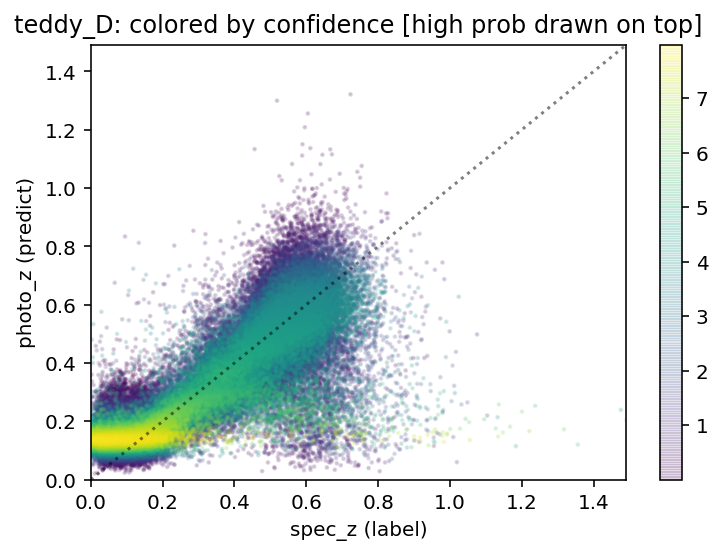

In [12]:
def display_cmap(ds, model, n=None, load_fn=load_teddy):
  df = load_fn(ds)
  indices = np.arange(len(df))  
  if n is not None:  # Select a subset
    indices = np.random.choice(len(df), size=n, replace=False) 
  labels = np.float64(df.redshift)[indices]
  samps = tf.convert_to_tensor(model(norm_feats(mk_feats(df)))).numpy()
  lim = 0, labels.max()
  probs = tf.minimum(model(norm_feats(mk_feats(df))).prob(samps), 100.)
  samps = samps[indices]
  probs = probs.numpy()[indices]
  plt.title(f'{load_fn.__name__.replace("load_", "")}_{ds}: '
            'colored by confidence [high prob drawn on top]')
  labels, samps, probs = map(list, zip(*sorted(zip(labels, samps, probs), key=lambda x: x[2])))
  plt.scatter(labels, samps, c=probs, s=2, alpha=.15)
  plt.xlabel('spec_z (label)'); plt.ylabel('photo_z (predict)')
  plt.plot(lim, lim, ':k', alpha=.5)
  plt.xlim(*lim); plt.ylim(*lim)
  plt.colorbar()
  plt.show()

for lik_fn in nn_custom_likelihood:
  print(lik_fn)
  for ds in 'BCD':
    display_joint(ds, nn_custom_likelihood[lik_fn], load_fn=load_teddy)
    display_cmap(ds, nn_custom_likelihood[lik_fn], load_fn=load_teddy)

These look OK, but the calibration is not always great, especially as we move further out of the training data domain (`teddy_C` and `teddy_D`).


### Visualize individual examples
We can look at some individual examples and the  distributions predicted by these networks:

likelihood: make_sigmoid_mog


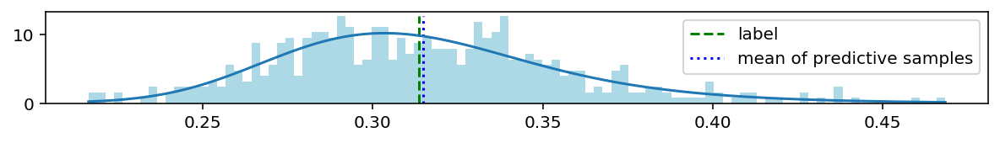

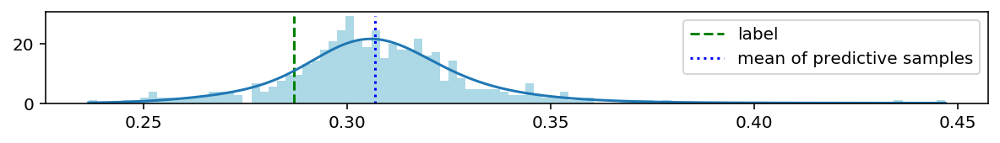

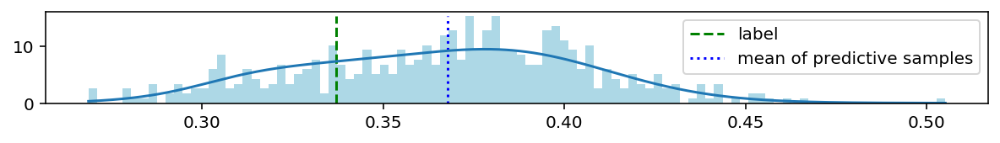

likelihood: make_beta


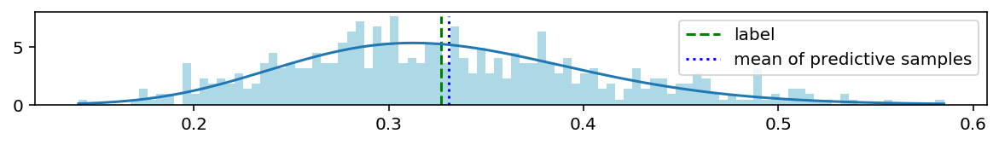

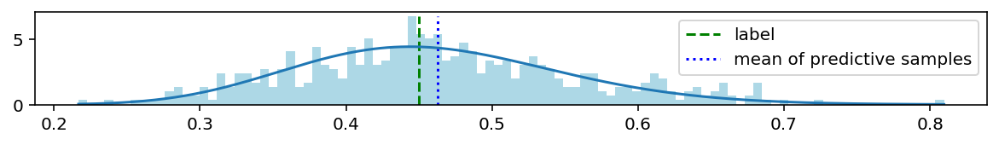

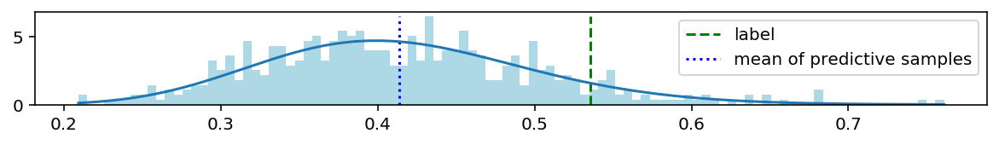

likelihood: make_beta_from_mean_sampsize


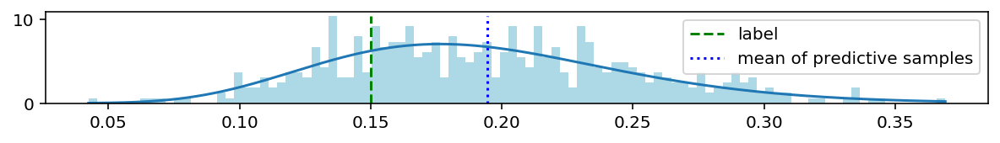

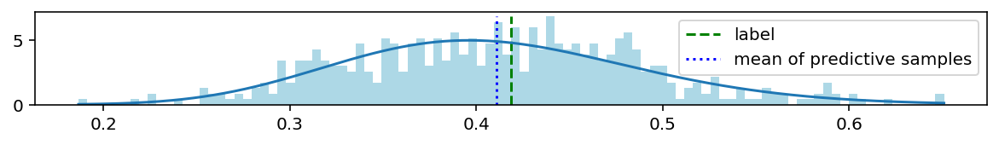

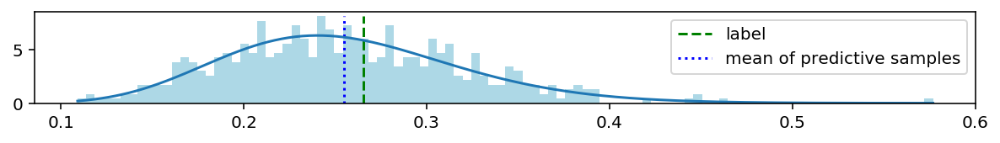

likelihood: make_beta_mixture_from_mean_sampsize


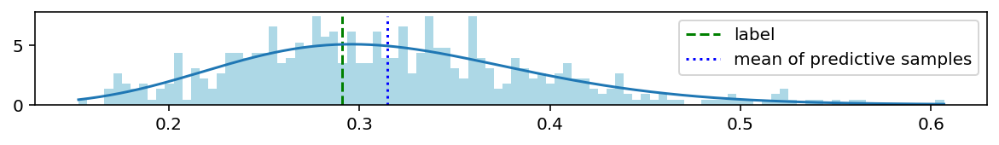

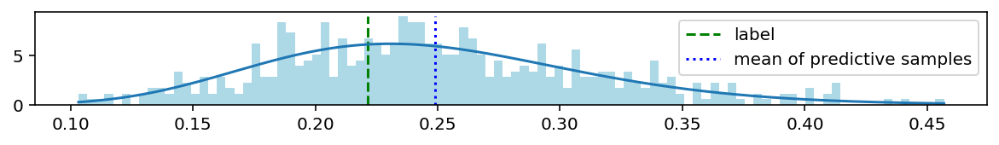

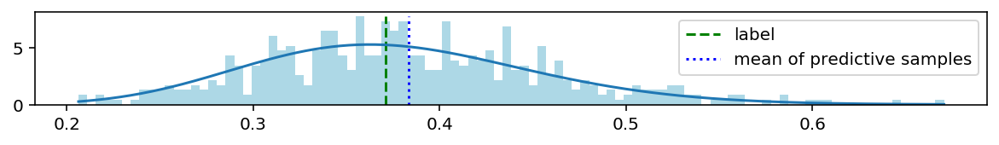

In [13]:
df = load_teddy('A')
# df = load_happy('A')

for lik_fn in nn_custom_likelihood:
  print(f'likelihood: {lik_fn}')
  for _ in range(3):
    idx = np.random.choice(len(df))
    getitem = lambda ds: ds[idx:idx+1]
    d = nn_custom_likelihood[lik_fn](getitem(feats))
    # Extra: visualize NN-parameterized spline transform.
    # if 'spline' in lik_fn:  
    #   plot_spline(d.bijector)
    plt.figure(figsize=(10,1))
    samps = d.sample(500).numpy()
    n, _, _ = plt.hist(samps, bins=100, density=True, log=False, color='lightblue')
    plt.vlines(getitem(df.redshift), ymin=0, ymax=np.max(n), colors='g', linestyles='--', label='label')
    plt.vlines(samps.mean(), ymin=0, ymax=np.max(n), colors='b', linestyles=':', label=f'mean of predictive samples')
    xs = np.linspace(np.min(samps), np.max(samps), num=500)
    plt.plot(xs, d.prob(xs))
    plt.legend(loc='best')
    plt.show()

## Variational Gaussian process regression

The relatively better calibration of local linear regression in Beck et al. suggests that a nonparametric model, such as a Gaussian process, might be more effective. Because of the dataset size we will try a variational GP.

The VGP is an inducing point-based approximation of an exact GP posterior. See more in the [class docstring in TFP](https://www.tensorflow.org/probability/api_docs/python/tfp/distributions/VariationalGaussianProcess?version=nightly#the_vgp), or read academic work:

- [Titsias 2009, "Variational Model Selection for Sparse Gaussian Process Regression"](http://proceedings.mlr.press/v5/titsias09a/titsias09a.pdf).
- [Hensman & Lawrence 2013, "Gaussian Processes for Big Data"](https://arxiv.org/abs/1309.6835).
- [Rasmussen & Williams. Gaussian Processes For Machine Learning, 2006](http://www.gaussianprocess.org/gpml/).

A neat thing we can achieve with the VGP is the layering of GP uncertainty over a neural-net-predicted mean value. Here, we use a neural net similar to above (just smaller) as the `mean_fn` of the VGP. Now in addition to the flexibility of the NN, we are able to get uncertainty estimates from the VGP.

A limitation of any GP is the normality assumption, so in this case redshift&lt;0 and redshift&gt;5 have nonzero density. Approaches exist to layer an alternative likelihood (e.g. a Poisson for count data, see: Cox process) atop a GP, but we will not pursue these here.


### Use variational inference to optimize kernel hyperparameters
We will simultaneously optimize the weights of the NN `mean_fn`.

Trainable parameters must be declared as instances of [`tf.Variable`](https://www.tensorflow.org/api_docs/python/tf/Variable).
Here, we use [`tfp.util.TransformedVariable`](https://www.tensorflow.org/probability/api_docs/python/tfp/util/TransformedVariable?version=nightly), which wraps an underlying `tf.Variable` and defers application of a constraining transform, so that the transform may be captured later in the scope of a [`tf.GradientTape`](https://www.tensorflow.org/api_docs/python/tf/GradientTape).

The kernel used here is Automatic Relevance Determination applied to an exp-quad kernel.


In [14]:
df = load_teddy('A')
# df = load_happy('A')

constrain_positive = tfb.Shift(np.float64(1e-3))(tfb.Exp())

amplitude_var = tfp.util.TransformedVariable(1., bijector=constrain_positive, name='amplitude', dtype=np.float64)
length_scale_var = tfp.util.TransformedVariable(1., bijector=constrain_positive, name='length_scale', dtype=np.float64)

observation_noise_variance_var = tfp.util.TransformedVariable(1., bijector=constrain_positive, 
                                                              name='observation_noise_variance_var', dtype=np.float64)

# Pick some examples to use as initial values for the index points.
num_inducing_points = 64
indices = np.random.choice(len(df), size=num_inducing_points, replace=False)
inducing_index_points = tf.Variable(norm_feats(mk_feats(df)).numpy()[indices], dtype=tf.float64, name='inducing_index_pts')
variational_inducing_observations_loc = tf.Variable(np.array(df.redshift)[indices], dtype=tf.float64, name='inducing_loc')
variational_inducing_observations_scale = tfp.util.TransformedVariable(
    .035 * tf.linalg.eye(variational_inducing_observations_loc.shape[-1], dtype=tf.float64), 
    bijector=tfb.FillScaleTriL(diag_bijector=constrain_positive), name='inducing_scale')

kernel = tfp.math.psd_kernels.ExponentiatedQuadratic(amplitude=amplitude_var, length_scale=length_scale_var)
feature_scale = tfp.util.TransformedVariable([3.] * inducing_index_points.shape[-1], bijector=constrain_positive, 
                                             name='feature_scale', dtype=tf.float64)
kernel = tfp.math.psd_kernels.FeatureScaled(kernel, feature_scale)

feats = norm_feats(mk_feats(df))
labels = tf.constant(np.float64(df.redshift))

# We create a trainable neural net mean function.
tf.keras.backend.set_floatx('float64')
inputs = tf.keras.Input((feats.shape[-1],))
m = tf.keras.layers.Dense(10)(inputs)
m = m + tf.keras.layers.Dense(10)(m)
m = m + tf.keras.layers.Dense(10)(m)
m = tf.keras.layers.Dense(1, activation=lambda x: 5 * tf.math.sigmoid(.1 * x[..., 0]))(m)
mean_fn = tf.keras.Model(inputs, m)

# Try one of these. Do you see the difference?
# mean_fn=lambda _: 0  # The default, equivalent to passing `None`.
# mean_fn=lambda _: np.mean(df.redshift, dtype=np.float64)

vgp = tfd.VariationalGaussianProcess(
    kernel=kernel,
    mean_fn=mean_fn,
    index_points=None,
    inducing_index_points=inducing_index_points,
    variational_inducing_observations_loc=variational_inducing_observations_loc,
    variational_inducing_observations_scale=variational_inducing_observations_scale,
    observation_noise_variance=1e-5)

batch_size = 256
num_training_points=len(df)

def loss_fn(x, y):
  return vgp.variational_loss(
      observations=y, observation_index_points=x, 
      kl_weight=float(batch_size) / float(num_training_points))
  
ds = tf.data.Dataset.from_tensor_slices((feats, labels)).shuffle(len(df)).batch(batch_size).repeat()
it = iter(ds)

tf.debugging.assert_all_finite(loss_fn(*next(it)), message='Unlucky index points?')

lr = tf.optimizers.schedules.PolynomialDecay(1e-2, decay_steps=2000)
opt = tf.optimizers.Adam(lr)

@tf.function(autograph=False)
def train_step():
  x, y = next(it)
  with tf.GradientTape() as tape:
    loss = loss_fn(x, y)
  grads = tape.gradient(loss, vgp.trainable_variables)
  opt.apply_gradients(zip(grads, vgp.trainable_variables))
  tf.debugging.assert_all_finite(loss, message='loss non-finite')
  return loss

def run_steps(num_steps):
  for i in range(num_steps):
    loss = train_step()
    if i % 500 == 0 or i == num_steps - 1:
      print(i, '\t', loss.numpy())
run_steps(5000)

Instructions for updating:
Do not pass `graph_parents`.  They will  no longer be used.


/usr/local/lib/python3.6/dist-packages/tensorflow_probability/python/distributions/gaussian_process.py:311: UserWarning: Unable to detect statically whether the number of index_points is 1. As a result, defaulting to treating the marginal GP at `index_points` as a multivariate Gaussian. This makes some methods, like `cdf` unavailable.
  'Unable to detect statically whether the number of index_points is '


0 	 1250948.9356611979
500 	 22692.431053533168
1000 	 29455.2898041288
1500 	 18512.95690774827
2000 	 25221.42942898292
2500 	 20924.2735661046
3000 	 20335.2038634712
3500 	 12830.193941291725
4000 	 16638.059387318543
4500 	 14629.630068391087
4999 	 17685.38265697705


### Visualize results

Since the normal distribution has an easily computed quantile function, we can also study the calibration of the model. i.e. If we ask for the 90th percentile of the posterior marginal distribution, is it true that 90% of observed labels are indeed lower?

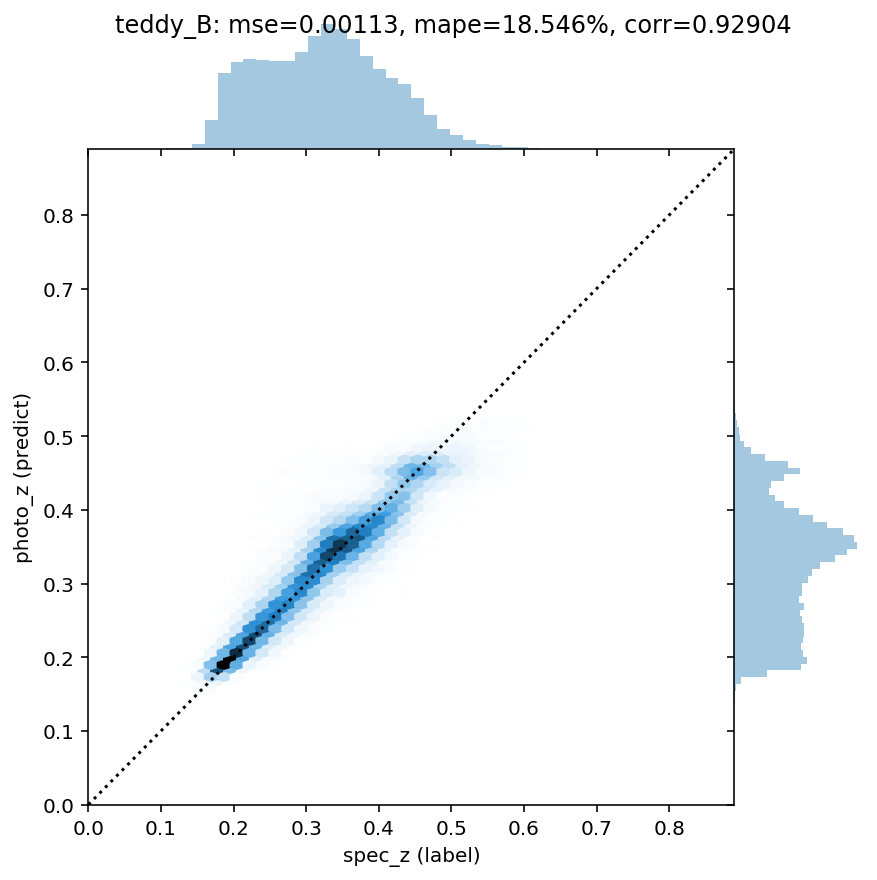

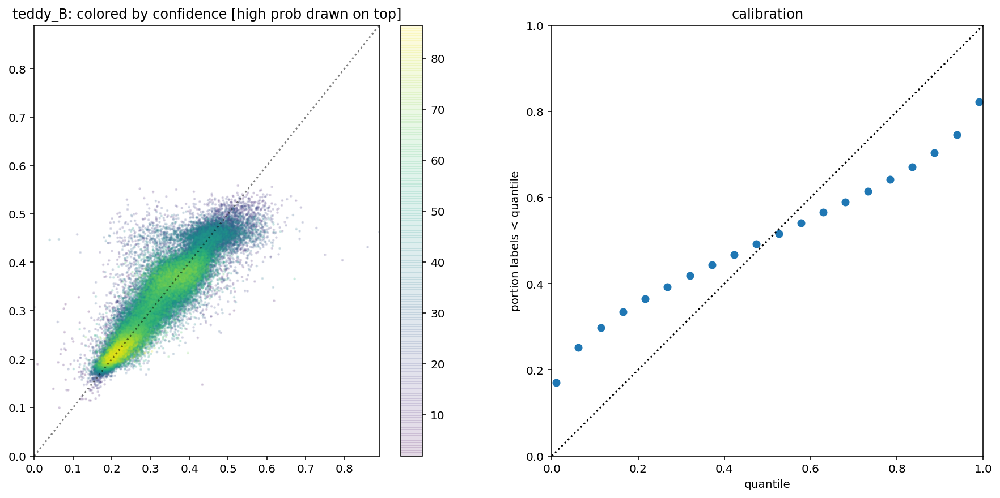

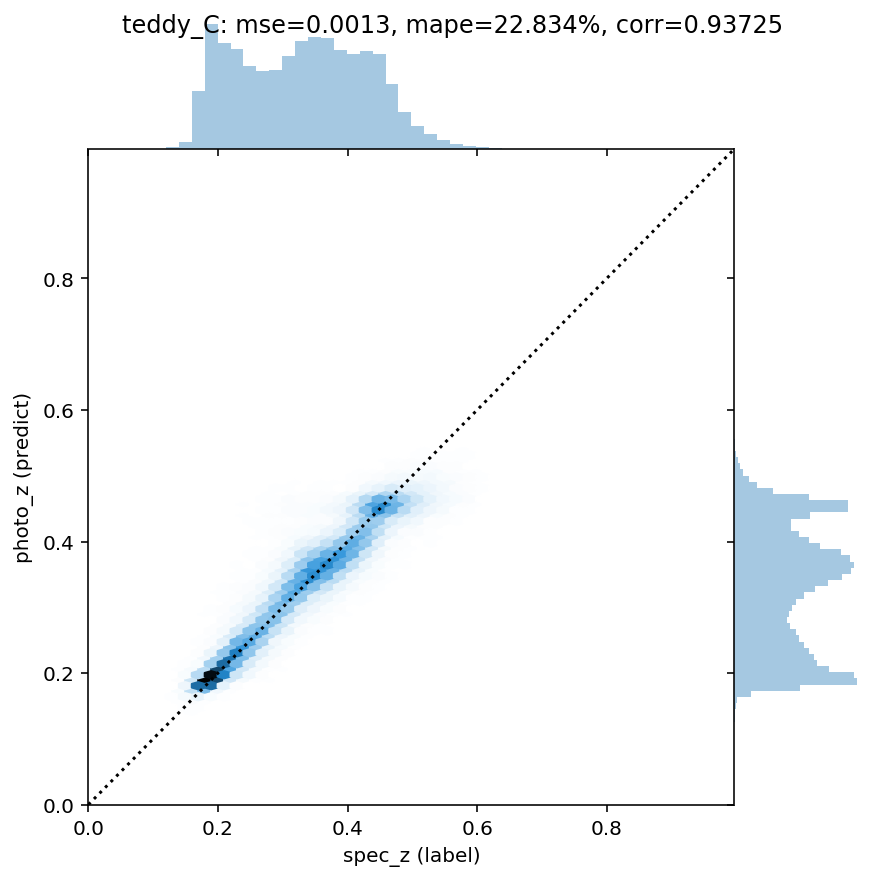

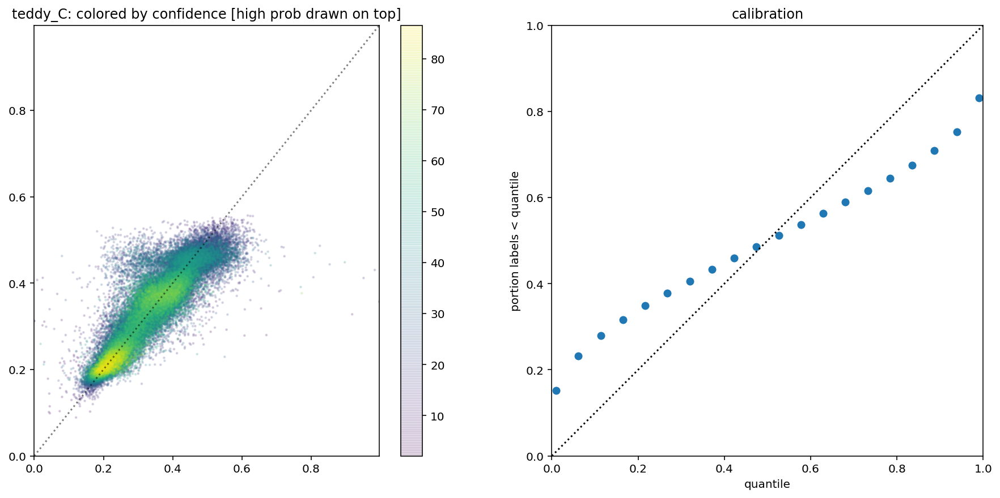

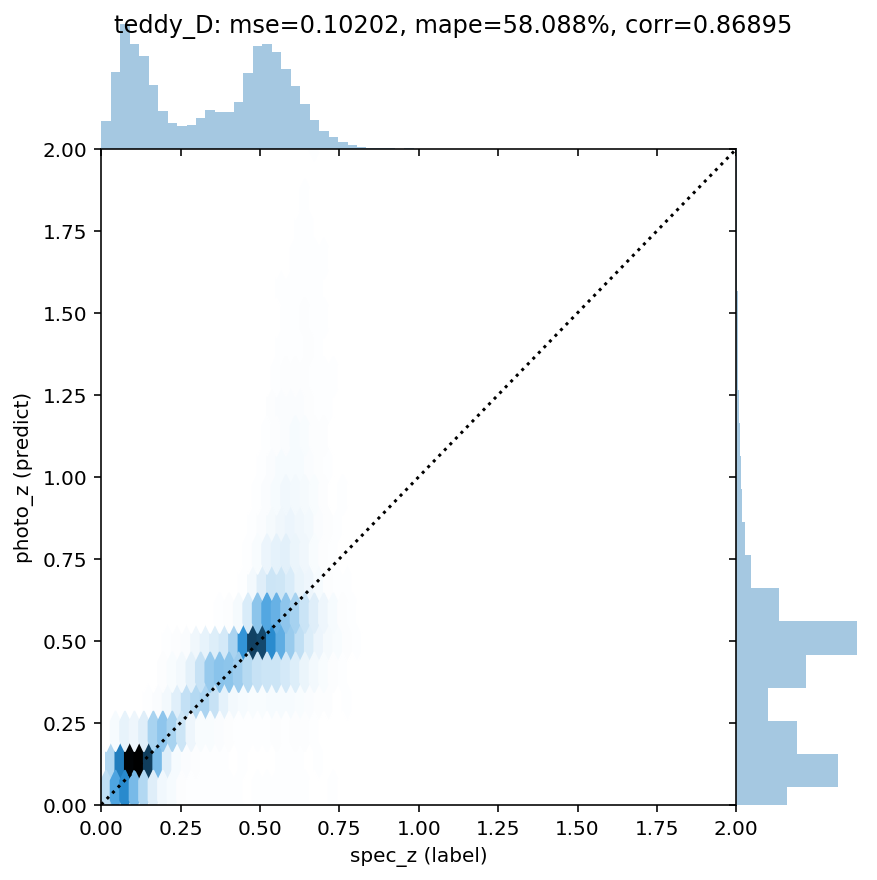

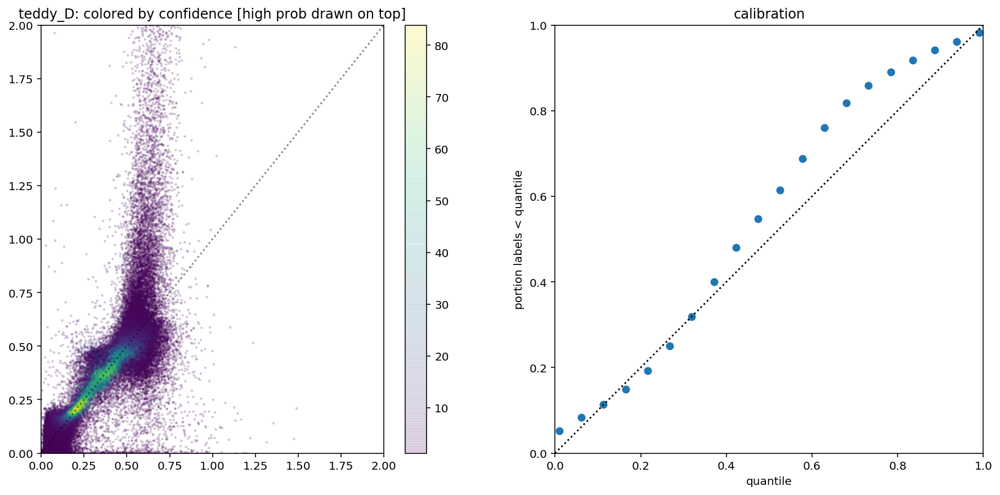

In [15]:
def display_vgp(ds, load_fn=load_teddy):
  df = load_fn(ds)
  feats = norm_feats(mk_feats(df))
  grp_size = 1
  indices = np.arange(len(df))
  np.random.shuffle(indices)
  indices = indices[:(len(df)//grp_size) * grp_size]#[:5000]
  index_points = feats.numpy()[indices]
  grouped_index_points = index_points.reshape(-1, grp_size, feats.shape[-1])
  marginals = vgp.get_marginal_distribution(index_points=grouped_index_points).copy(name=f'marginal_teddy_{ds}')
  # print(marginals)  # shows batch/event shape of the marginal dist len(df)//grp_size batches, grp_size event dim
  # nsamp = 1; samps = marginals.sample(nsamp).numpy()
  nsamp = 1; samps = marginals.mean().numpy()
  probs = marginals.prob(samps).numpy().reshape(-1)
  std = marginals.stddev().numpy().reshape(-1)
  bc_redshift = np.array(df.redshift)[indices].reshape(-1,1,grp_size) + np.zeros_like(samps.reshape(-1, nsamp, grp_size))
  labs=np.array(df.redshift)[indices]
  qs = np.linspace(.01, .99, num=20)
  within_q = []
  for q in qs:
    within_q.append(np.sum(labs < marginals.quantile(q)) / len(df))
  samps = samps.reshape(-1)
  labels = bc_redshift.reshape(-1)
  lim = 0, min(2, max(samps.max(), labels.max()))
  g = sns.jointplot(labels, samps, kind='hex', gridsize=50, space=0, xlim=lim, ylim=lim)
  g.ax_joint.plot(lim, lim, ':k')
  g.fig.suptitle(f'teddy_{ds}: '
      f'mse={np.round(tf.keras.metrics.mse(labels, samps), 5)}, '
      f'mape={np.round(tf.keras.metrics.mape(labels, samps), 3)}%, '
      f'corr={np.round(stats.spearmanr(labels, samps)[0], 5)}')
  g.set_axis_labels('spec_z (label)', 'photo_z (predict)')
  plt.show()

  plt.figure(figsize=(15,7))
  plt.subplot(122)
  plt.title('calibration')
  plt.scatter(qs, within_q);plt.xlabel('quantile');plt.ylabel('portion labels < quantile');plt.xlim(0,1);plt.ylim(0,1);plt.plot([0,1],[0,1],':k')
  plt.subplot(121)
  plt.title(f'{load_fn.__name__.replace("load_", "")}_{ds}: '
            'colored by confidence [high prob drawn on top]')
  labels, samps, probs = map(list, zip(*sorted(zip(labels, samps, probs), key=lambda x: x[2])))
  plt.scatter(labels, samps, c=probs, s=2, alpha=.15)
  plt.plot(lim, lim, ':k', alpha=.5)
  plt.xlim(*lim); plt.ylim(*lim)
  plt.colorbar()
  plt.show()

for ds in 'BCD':
  display_vgp(ds, load_fn=load_teddy)

### Exercises

#### Try an alternative `mean_fn`
Some alternatives are commented-out inline above. Can you see the difference?

#### Try a different GP kernel

Different kernels have allow encoding into the prior different hypotheses about the data, for example cyclic behavior. See, for example, the [kernel cookbook](https://www.cs.toronto.edu/~duvenaud/cookbook/).

A list of alternative TFP kernels can be found [here](https://www.tensorflow.org/probability/api_docs/python/tfp/math/psd_kernels#classes).

## Train a full-on BNN

We've done NN, MLE, and VGP. Now let's do variational inference on a BNN.

We will use the `tfp.experimental.nn` library, which lets us use variational inference to optimize the weights of a BNN. This library is built around using [`tf.Module`](https://www.tensorflow.org/api_docs/python/tf/Module?version=nightly) for automatic variable tracking (similar to [SonnetV2](https://sonnet.readthedocs.io/en/latest/)).

As we did above with a Keras-driven NN, we can try each likelihood model, parameterized by the outputs of a BNN.

### Train a BNN for each likelihood model

In [16]:
import collections
import tqdm
tfp_nn = tfp.experimental.nn

df = load_teddy('A')
# df = load_happy('A')

penalty_weight = 1. / len(df)

class Resnet(tfp_nn.Sequential):
  def __call__(self, arg):
    return arg + super().__call__(arg)

# A bug in tfp.experimental.nn prevents us using float64 right now.
dtype = tf.float32
tf.keras.backend.set_floatx('float32')

bnns = {}

for lik_fn in likelihood_options:
  likelihood_name = lik_fn.__name__
  model = bnns[likelihood_name] = tfp_nn.Sequential([
      lambda x: tf.cast(x, tf.float32),
      tfp_nn.AffineVariationalFlipout(feats.shape[-1], 64, dtype=dtype, penalty_weight=penalty_weight), tf.math.tanh,
      Resnet([tfp_nn.AffineVariationalFlipout(64, 64, dtype=dtype, penalty_weight=penalty_weight), tf.math.tanh]),
      Resnet([tfp_nn.AffineVariationalFlipout(64, 64, dtype=dtype, penalty_weight=penalty_weight), tf.math.tanh]),
      tfp_nn.AffineVariationalFlipout(64, lik_fn.num_activations, dtype=dtype, penalty_weight=penalty_weight),
      tfp.layers.DistributionLambda(lik_fn)
  ])

  def loss(feats, labels):
    nll = -tf.reduce_mean(model(feats).log_prob(labels))
    kl = model.extra_loss
    return nll + kl, collections.namedtuple('loss','nll,kl')(nll, kl)

  opt = tf.optimizers.Adam(.2)
  fit = tfp_nn.util.make_fit_op(loss_fn=loss, optimizer=opt, trainable_variables=model.trainable_variables, xla_compile=False)

  feats = tf.cast(norm_feats(mk_feats(df)), tf.float32)
  labels = tf.constant(df.redshift, dtype=tf.float32)

  batch_size = 4096
  ds = tf.data.Dataset.from_tensor_slices((feats, labels)).shuffle(len(df)).batch(batch_size)
  nepochs = 20
  print(f'likelihood: {likelihood_name}')
  for ep in range(nepochs):
    tq = tqdm.tqdm_notebook(iter(ds), total=(len(df) + batch_size - 1) // batch_size)
    tq.set_description(f'epoch {ep+1}/{nepochs}')
    for feats, labels in tq:
      losses = tf.nest.map_structure(lambda x: np.round(np.float64(x), 3), fit(feats, labels))
      tq.set_postfix_str(f'{losses}')
    tq.close()

likelihood: make_sigmoid_mog



likelihood: make_beta



likelihood: make_beta_from_mean_sampsize



likelihood: make_beta_mixture_from_mean_sampsize


### Visualize the results

likelihood: make_sigmoid_mog


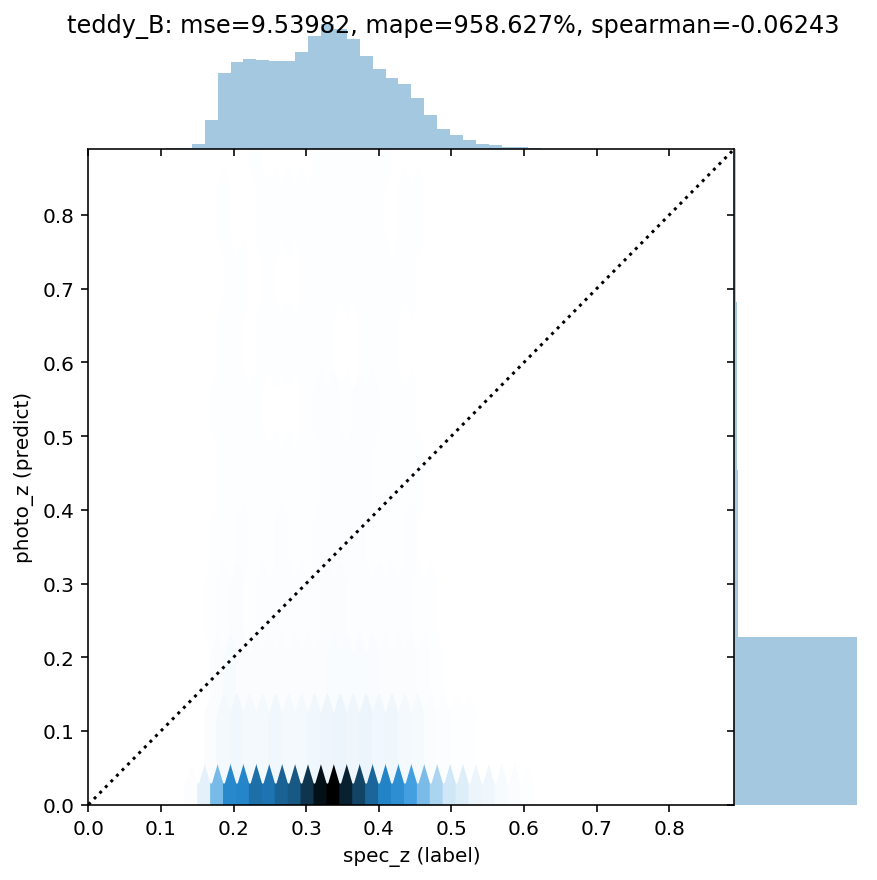

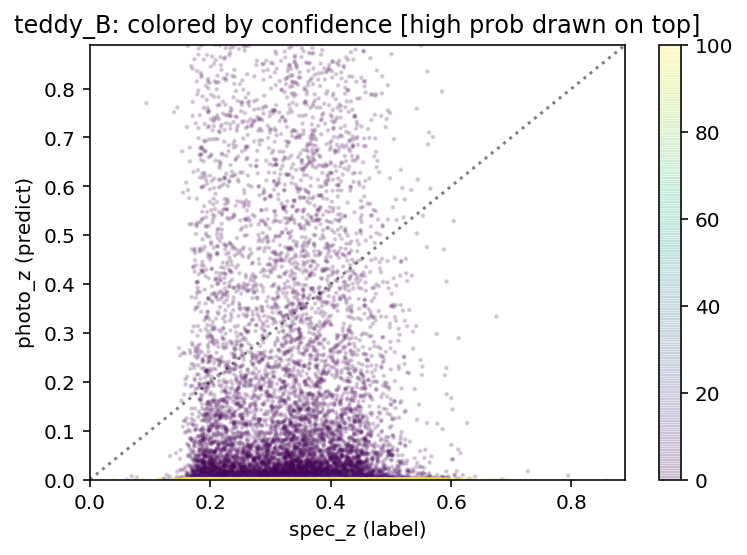

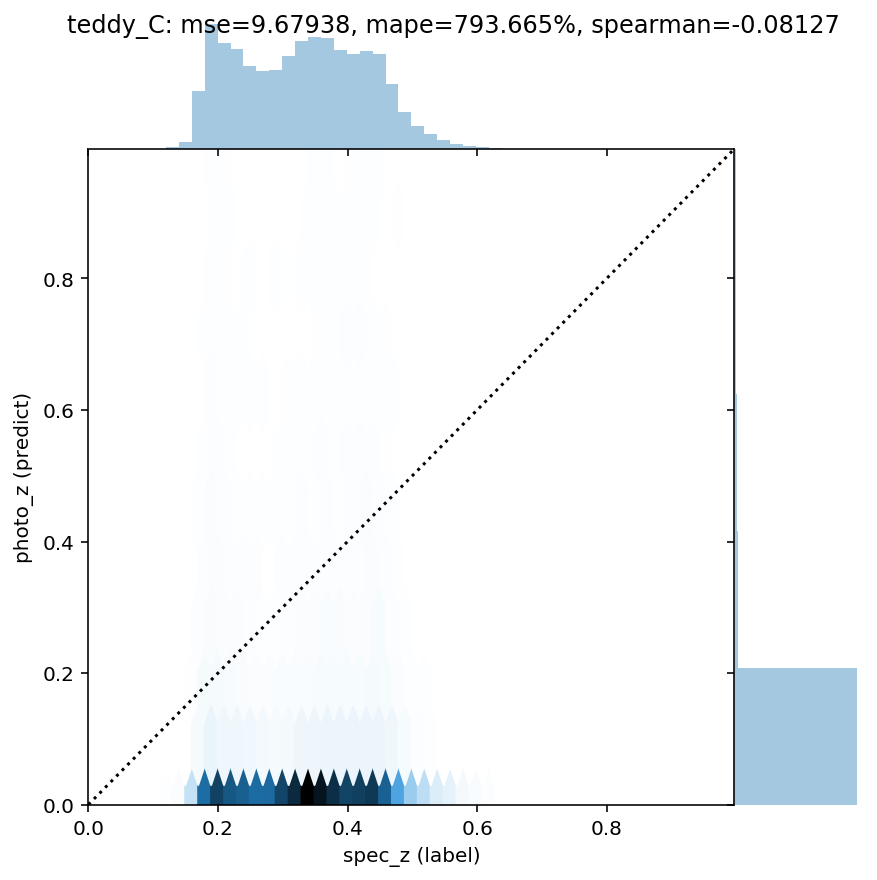

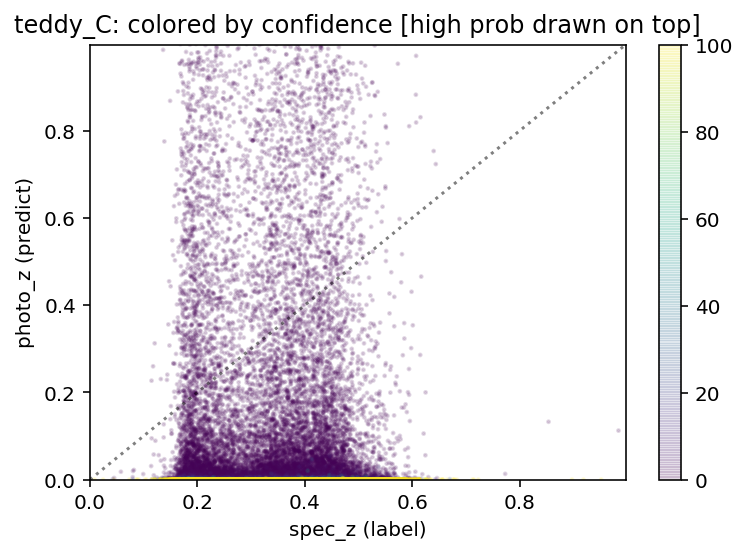

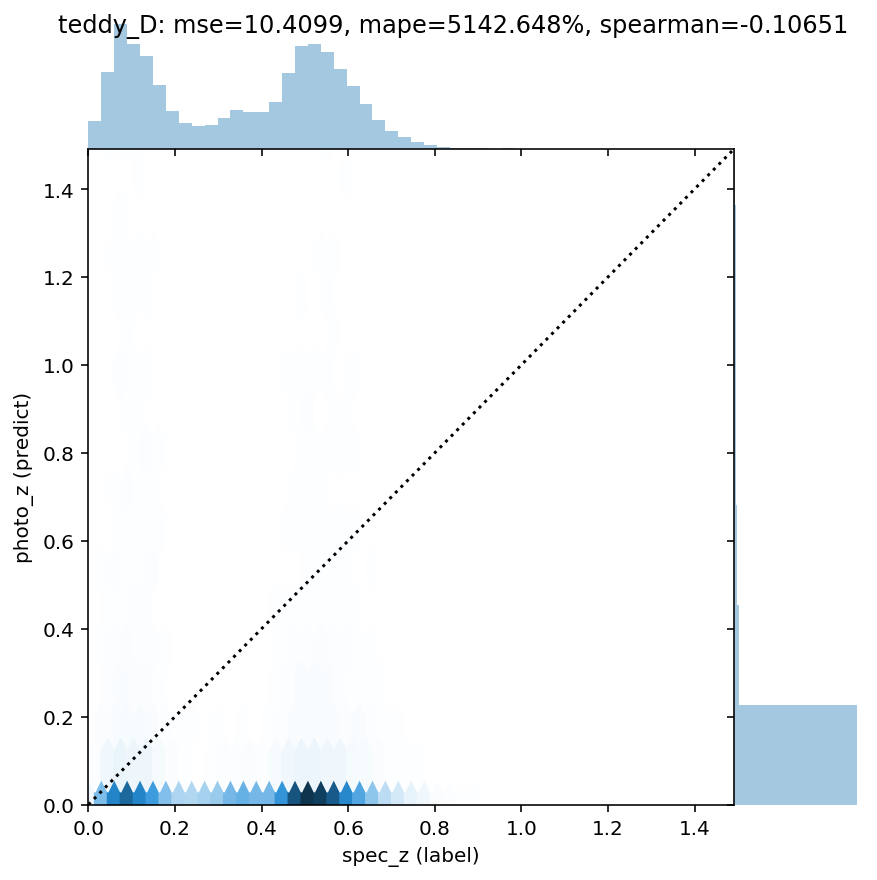

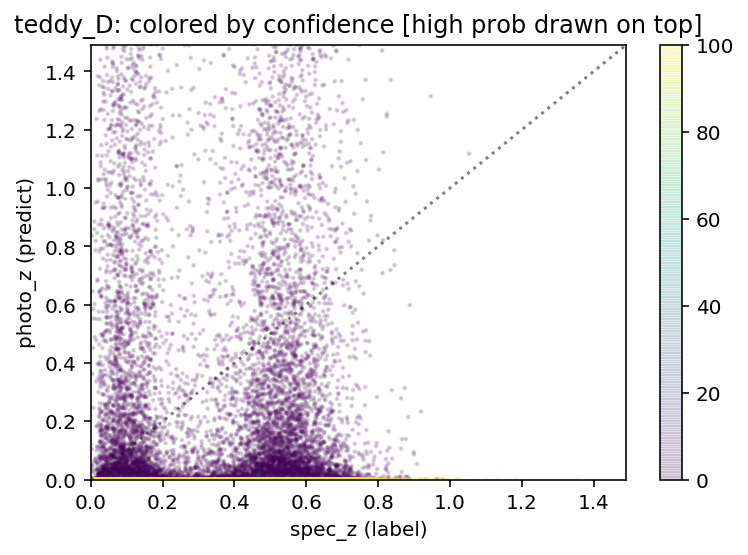

likelihood: make_beta


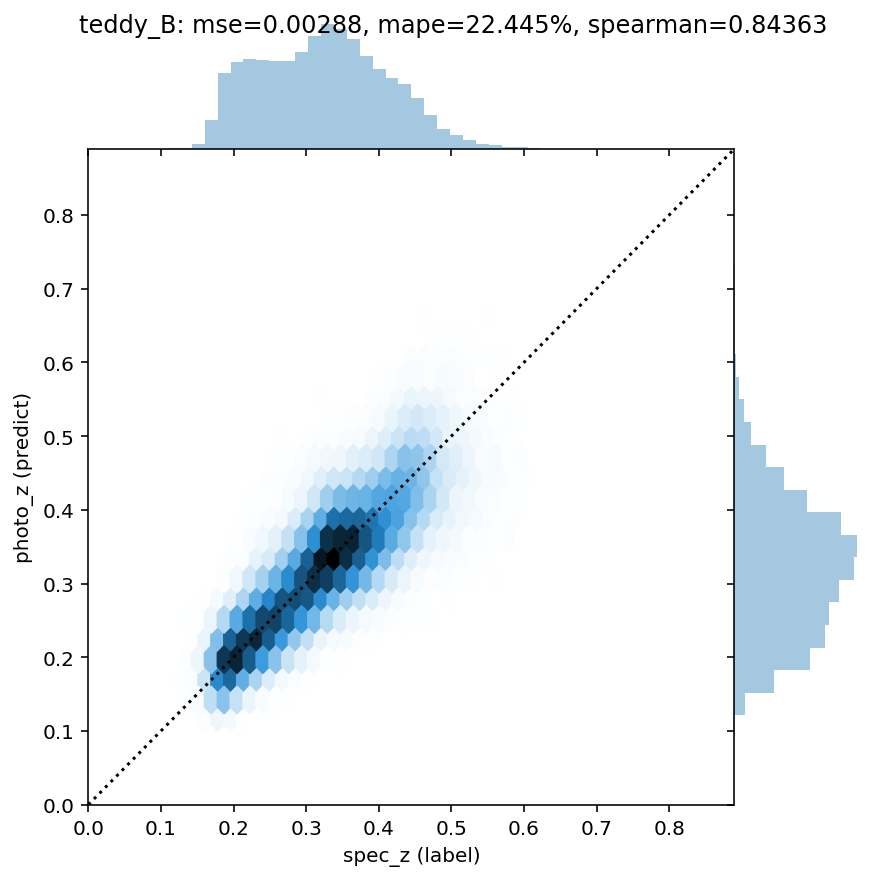

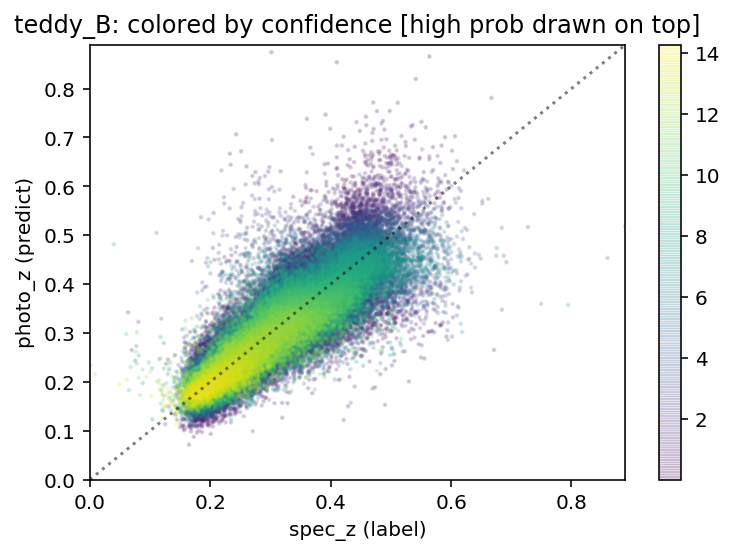

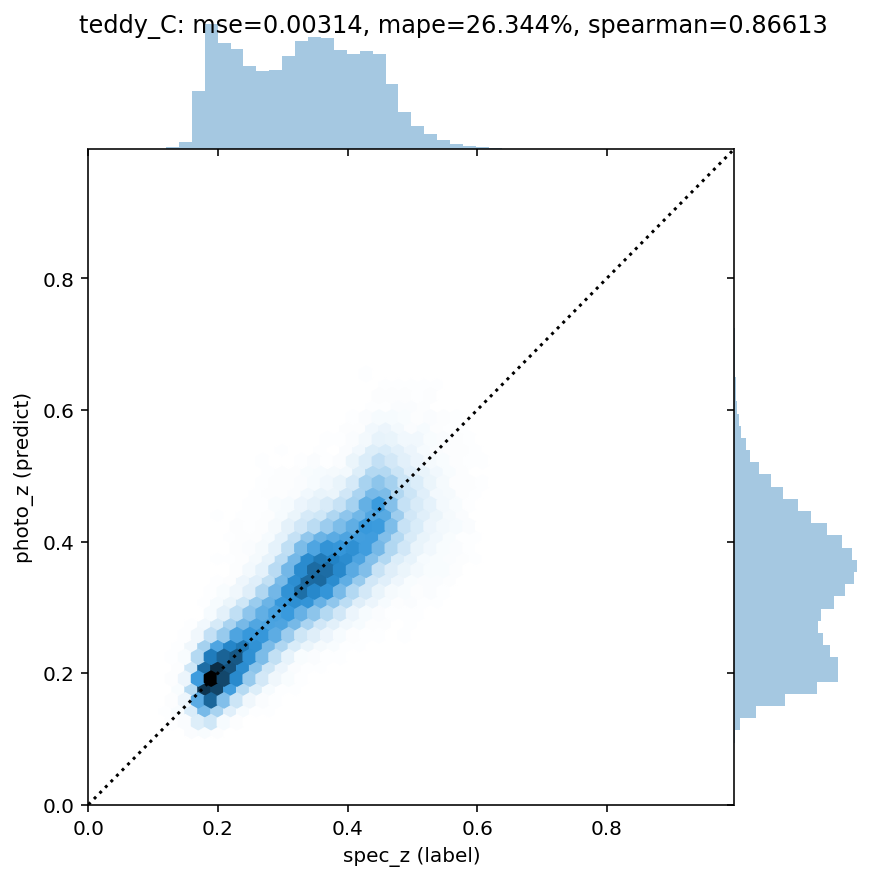

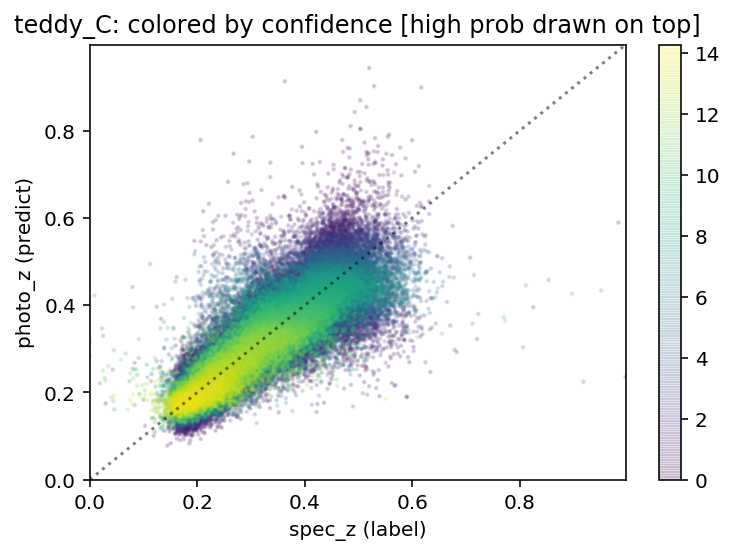

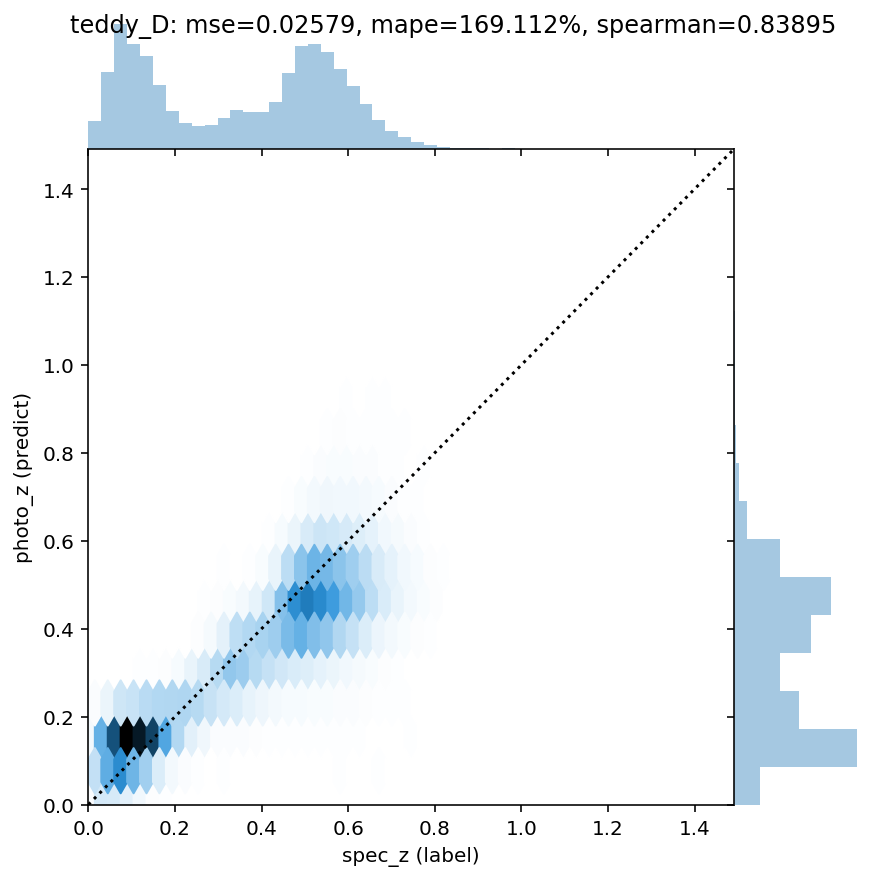

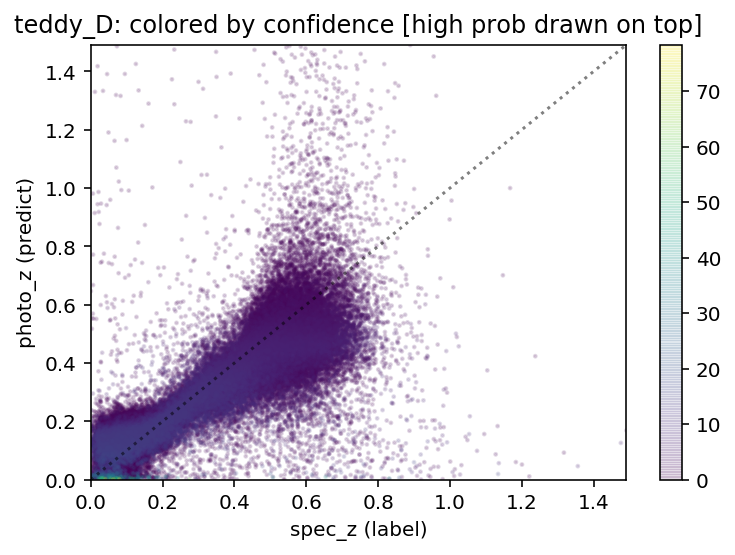

likelihood: make_beta_from_mean_sampsize


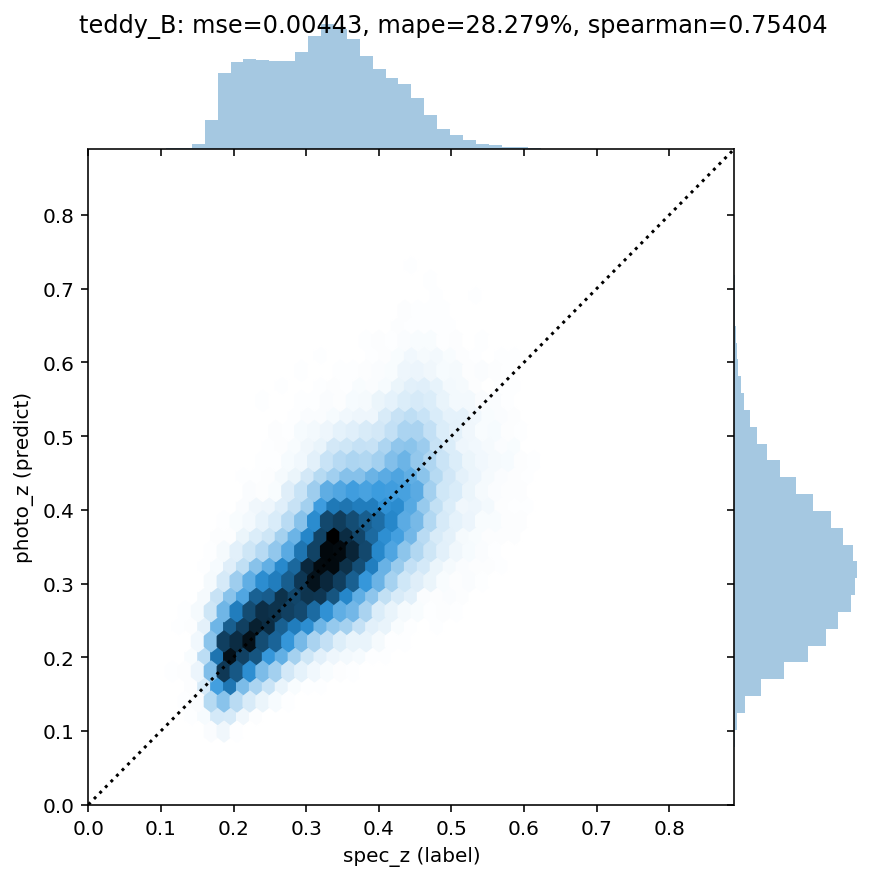

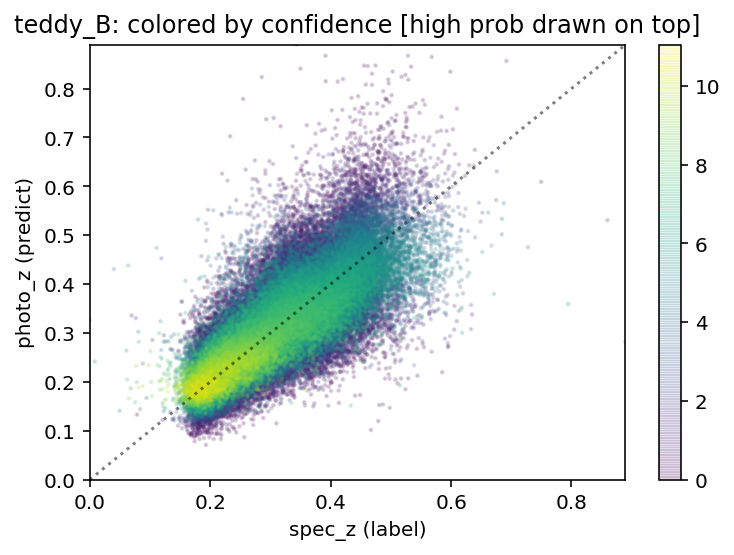

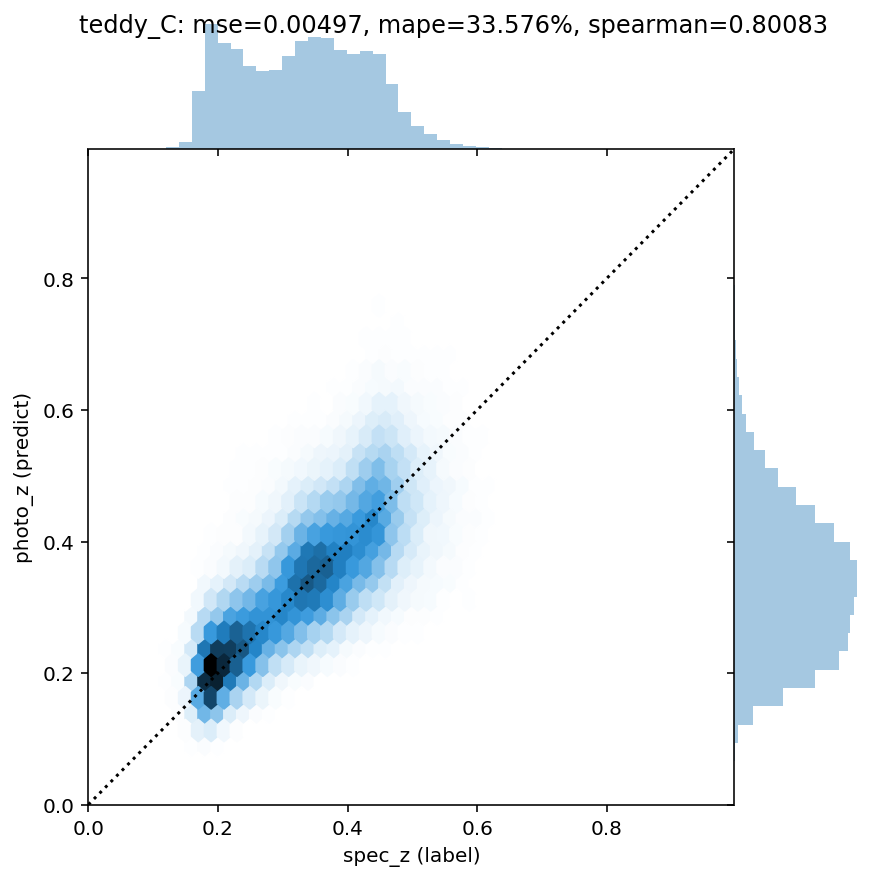

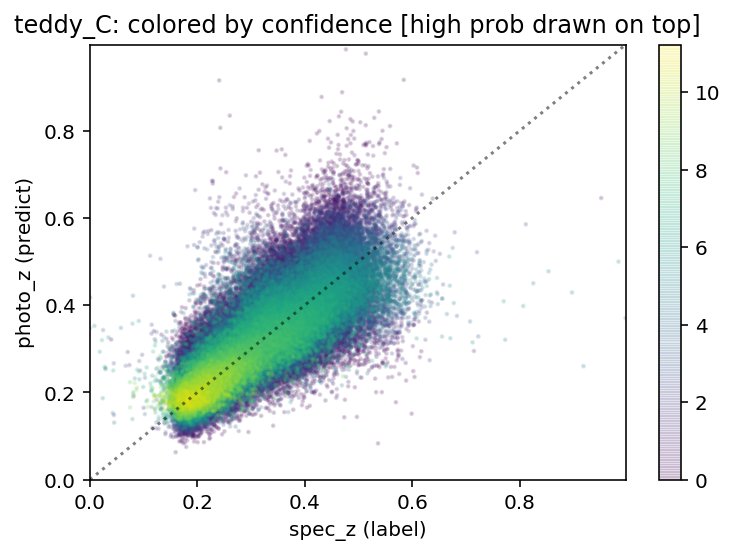

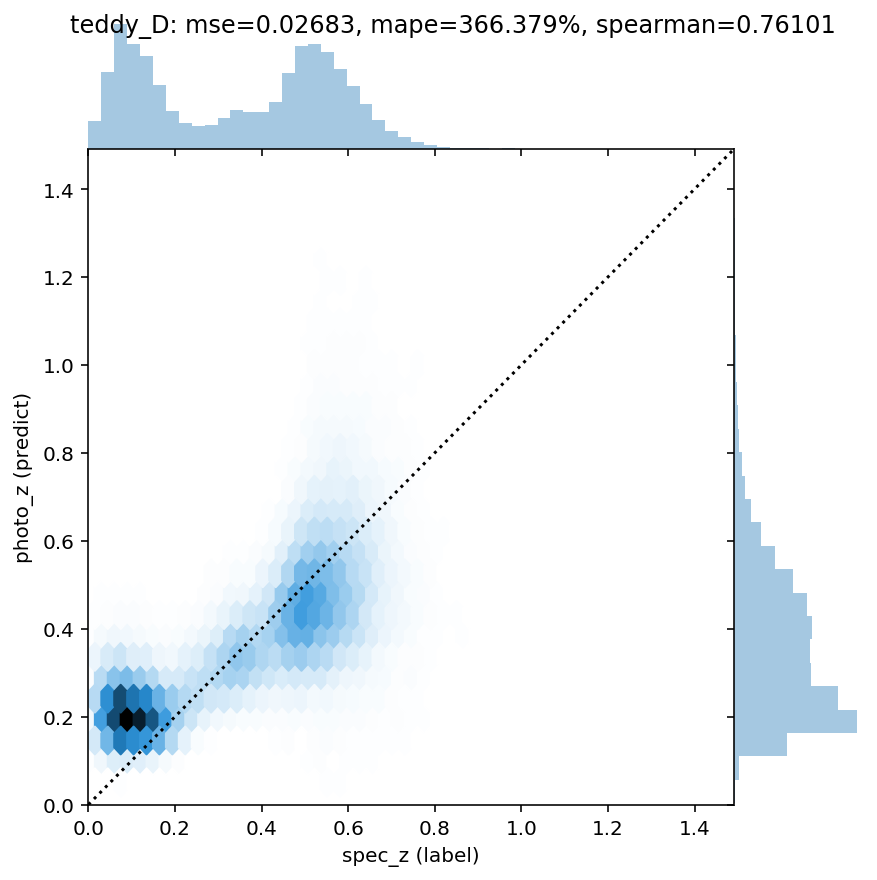

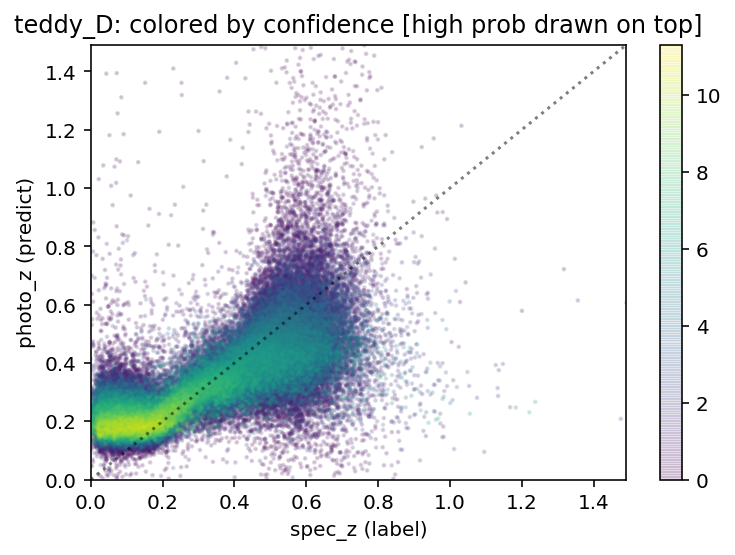

likelihood: make_beta_mixture_from_mean_sampsize


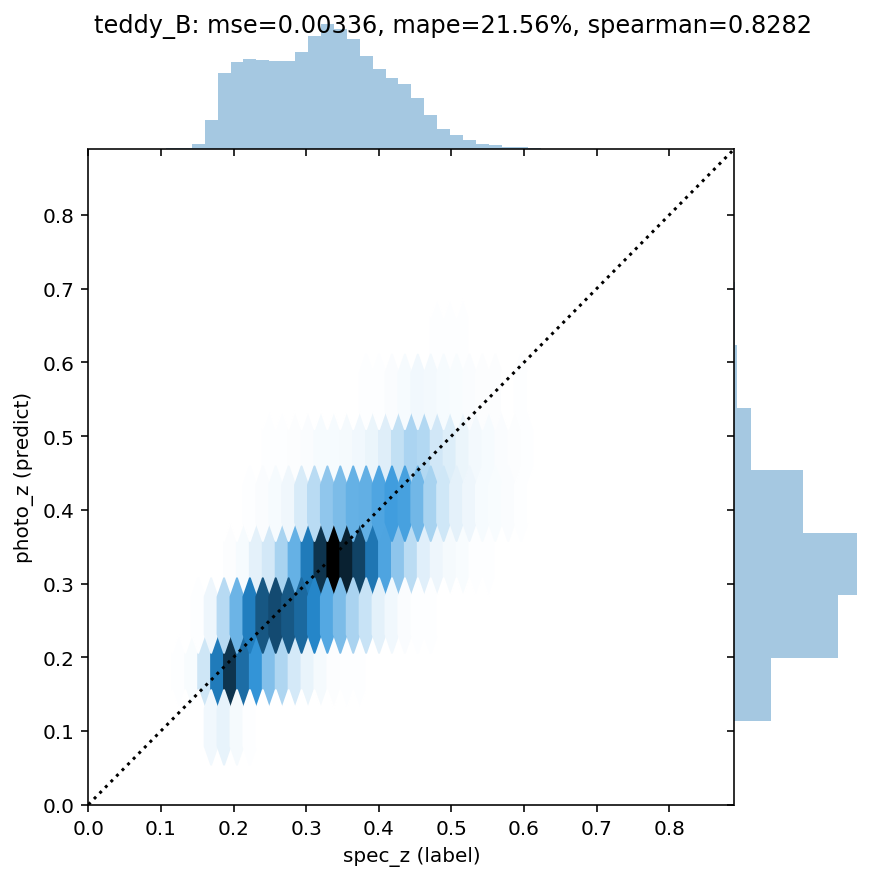

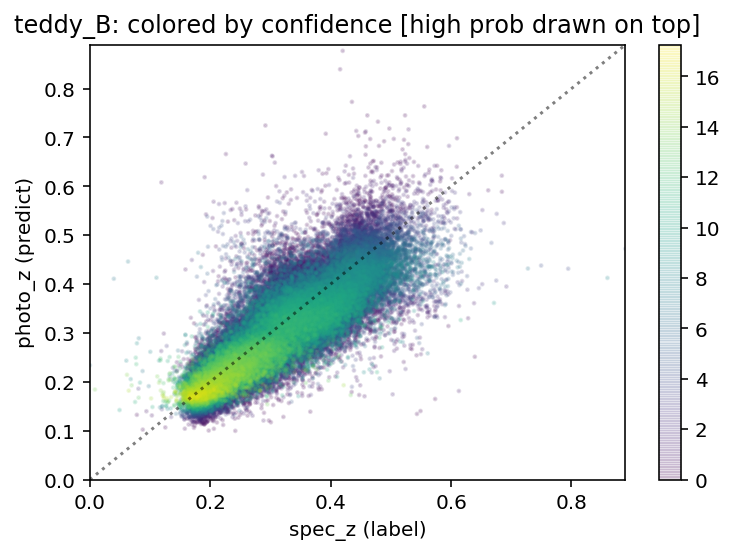

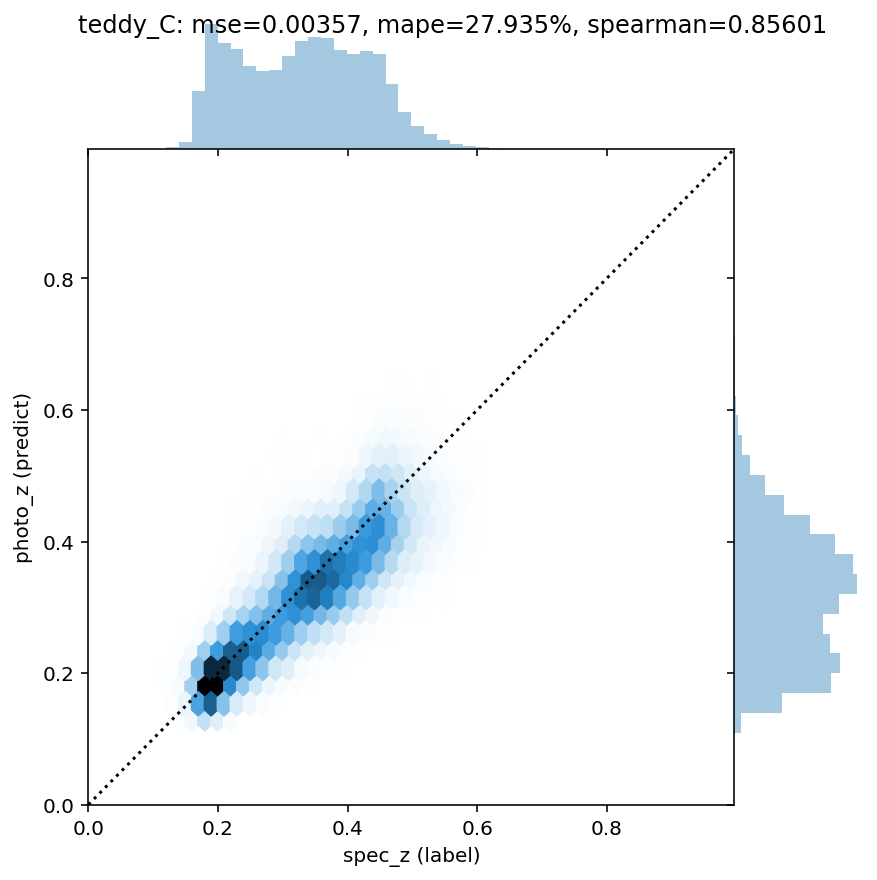

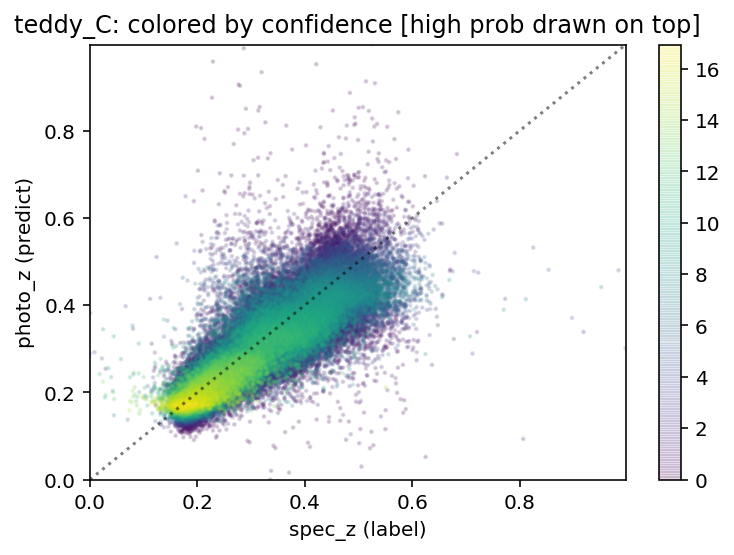

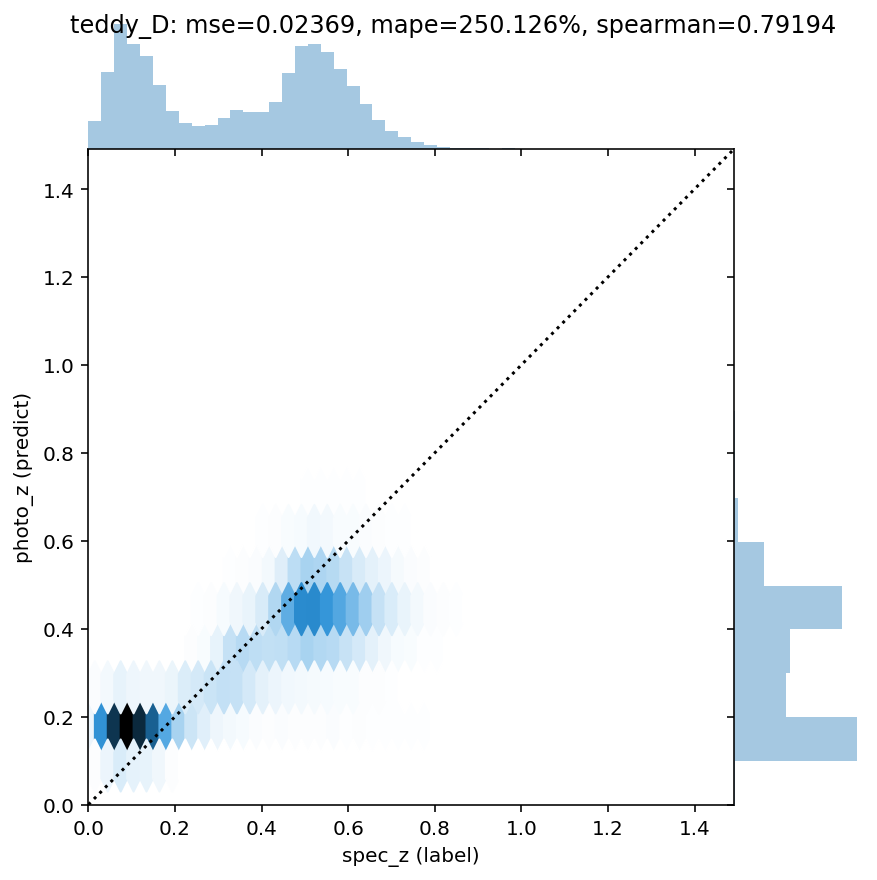

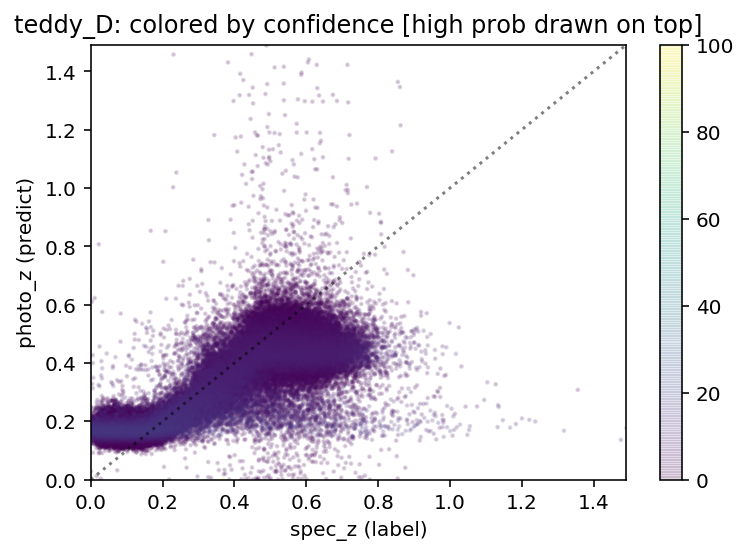

In [17]:
for lik_fn in bnns:
  print(f'likelihood: {lik_fn}')
  for ds in 'BCD':
    display_joint(ds, bnns[lik_fn], load_fn=load_teddy)
    display_cmap(ds, bnns[lik_fn], load_fn=load_teddy)

Some of the likelihood models look pretty terrible when we sample parameters using a BNN.

This is probably because the spike and slab prior serving as the default in this library is somewhat different from the default initializers of the NN we used above. The right prior to use for BNN weights is still an open area of research. Alternatively, the BNN could be hampered by the mean-field assumption in both prior and posterior families. As an exercise below, you could try to change this.

Notably the beta-from-mean/sample-size and mixture thereof are working pretty well.

Does the gamma from mean/var work well?

### Visualize individual examples

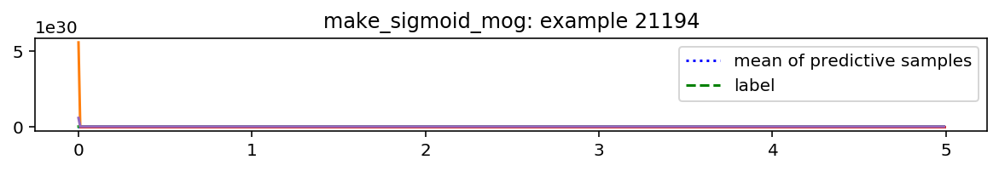

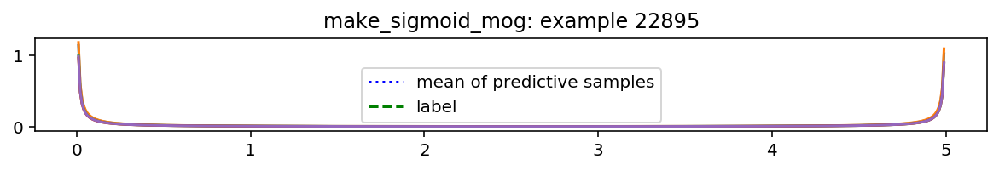

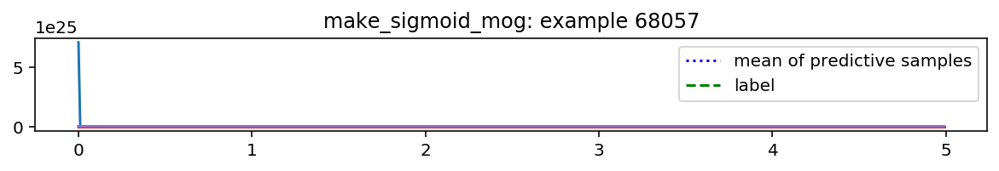

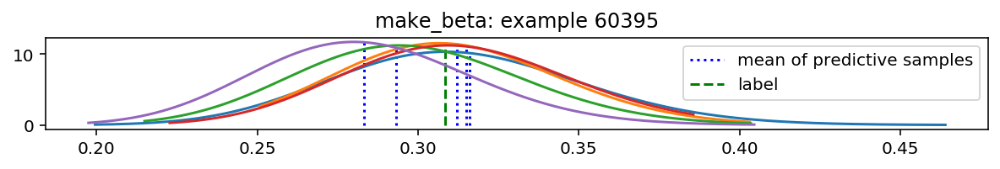

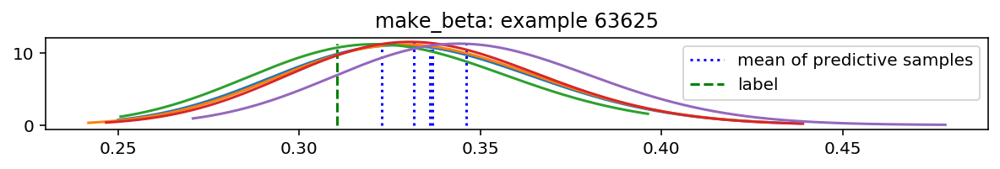

...

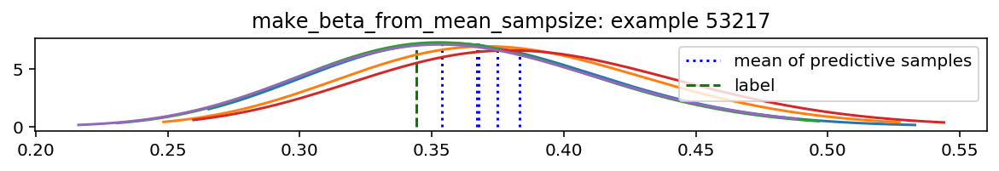

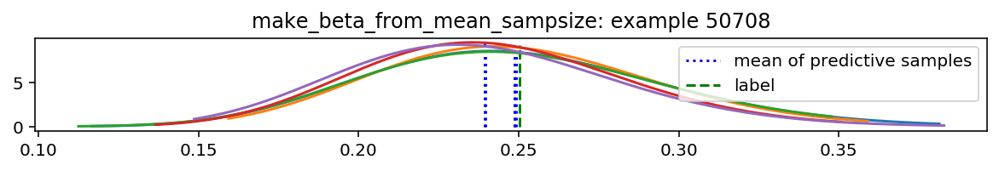

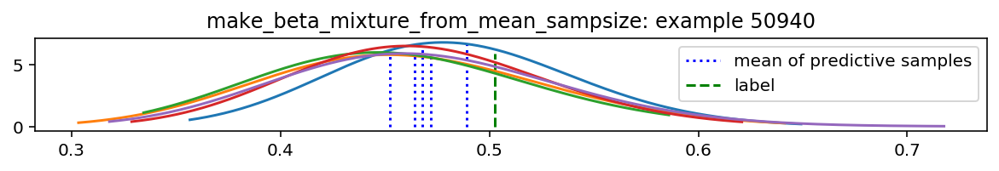

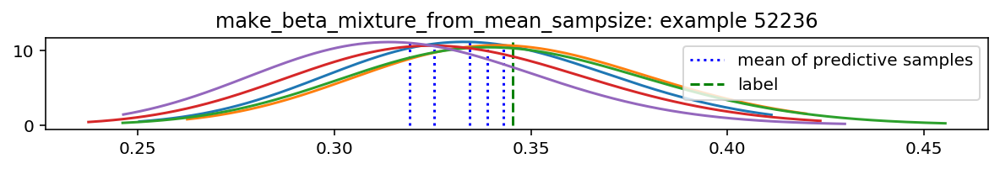

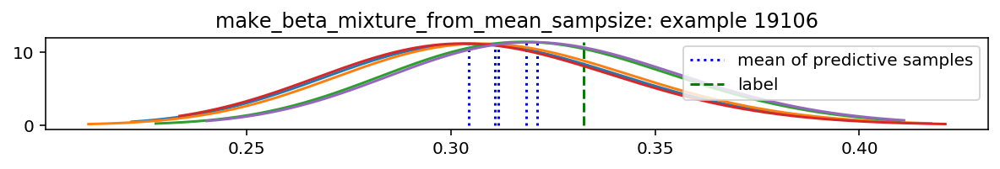

In [18]:
df = load_teddy('A')
feats = tf.cast(norm_feats(mk_feats(df)), tf.float32)

for lik_fn in bnns:
  for _ in range(3):
    idx = np.random.choice(len(df))
    getitem = lambda ds: ds[idx:idx+1]
    for s in range(5):  # Sample N realizations of the bnn -> distribution
      d = bnns[lik_fn](getitem(feats))
      # Extra: Visualize the spline transform.
      # if 'spline' in lik_fn and s == 0:
      #   plot_spline(d.bijector)
      samps = d.sample(100).numpy()
      xs = np.linspace(np.min(samps), np.max(samps), num=500)
      probs = d.prob(xs)
      if s == 0:
        plt.figure(figsize=(10, 1))
        plt.title(f'{lik_fn}: example {idx}')
      plt.plot(xs, probs)
      plt.vlines(samps.mean(), ymin=0, ymax=np.max(probs), colors='b', linestyles=':', label=f'mean of predictive samples' if s == 0 else None)
    plt.vlines(getitem(df.redshift), ymin=0, ymax=np.max(probs), colors='g', linestyles='--', label='label')
    plt.legend(loc='best')
    plt.show()

## Exercises

### Change cells to run against the `happy` datasets
Loosely speaking, `s/load_teddy/load_happy/`

### Tinker with the BNN
Read more about this experimental BNN library and see examples of usage [here](https://github.com/tensorflow/probability/tree/main/tensorflow_probability/python/experimental/nn/examples).

- change learning rate
- change kl penalty weight to a `tf.Variable(.., trainable=False)` and increase it gradually from `0` to `1/num_examples` over the first N optimization steps (using `var.assign(val)`)
- try to customize the prior, initialization, or surrogate posterior so that the `make_sigmoid_mog` likelihood is better able to fit the data (print out the MVNDiag [mean-field] default implementation of `make_posterior_fn` in the next cell, and try modifying the kernel distribution to a [dense MVN](https://www.tensorflow.org/probability/api_docs/python/tfp/distributions/MultivariateNormalTriL?version=nightly)), e.g.
```python
tfd.MultivariateNormalTriL(
    loc=tf.Variable(tf.zeros([..])),
    scale_tril=tfp.util.TransformedVariable(tf.linalg.eye(..), tfb.FillScaleTriL()))
```


In [19]:
import inspect
print(inspect.getsource(tfp_nn.util.make_kernel_bias_posterior_mvn_diag))

def make_kernel_bias_posterior_mvn_diag(
    kernel_shape,
    bias_shape,
    dtype=tf.float32,
    kernel_initializer=None,
    bias_initializer=None,
    kernel_name='posterior_kernel',
    bias_name='posterior_bias'):
  """Create learnable posterior for Variational layers with kernel and bias.

  Args:
    kernel_shape: ...
    bias_shape: ...
    dtype: ...
      Default value: `tf.float32`.
    kernel_initializer: ...
      Default value: `None` (i.e., `tf.initializers.glorot_uniform()`).
    bias_initializer: ...
      Default value: `None` (i.e., `tf.zeros`).
    kernel_name: ...
      Default value: `"posterior_kernel"`.
    bias_name: ...
      Default value: `"posterior_bias"`.

  Returns:
    kernel_and_bias_distribution: ...
  """
  if kernel_initializer is None:
    kernel_initializer = tf.initializers.glorot_uniform()
  if bias_initializer is None:
    bias_initializer = tf.zeros
  make_loc = lambda shape, init, name: tf.Variable(  # pylint: disable=g-long-lambda
      i

### Try out Jax
[Jax docs](https://jax.readthedocs.io/en/latest/)

[TFP on Jax demo](https://colab.sandbox.google.com/github/tensorflow/probability/blob/main/discussion/examples/TFP_and_Jax.ipynb)

## Appendix

### Visualizing target redshifts of each dataset

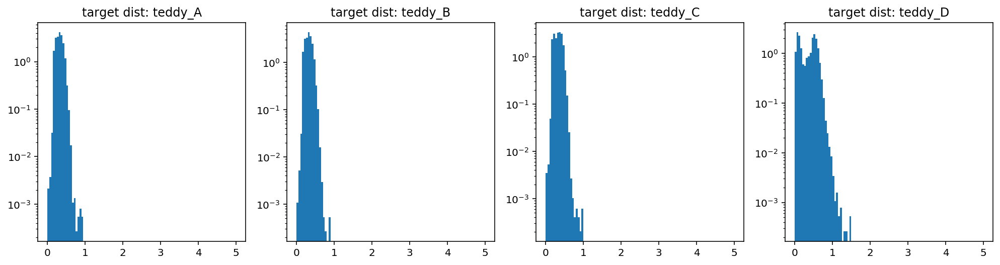

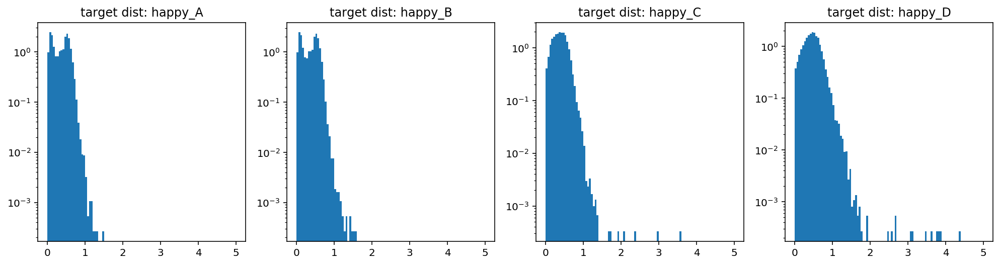

In [20]:
for dst in 'teddy', 'happy':
  plt.figure(figsize=(17,4))
  for ds in 'ABCD':
    plt.subplot(141 + 'ABCD'.index(ds))
    plt.hist({'teddy':load_teddy,'happy':load_happy}[dst](ds).redshift, bins=100, log=True, density=True, range=(0, 5));plt.title(f'target dist: {dst}_{ds}')
  plt.show()

### Visualizing joint and marginal distributions in the data

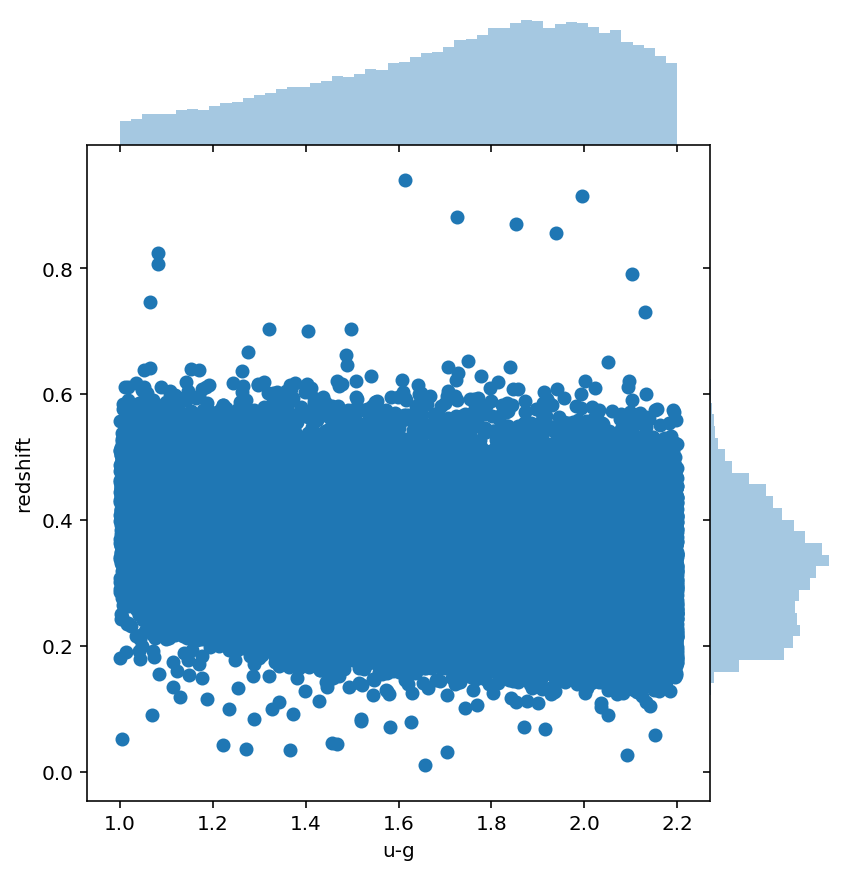

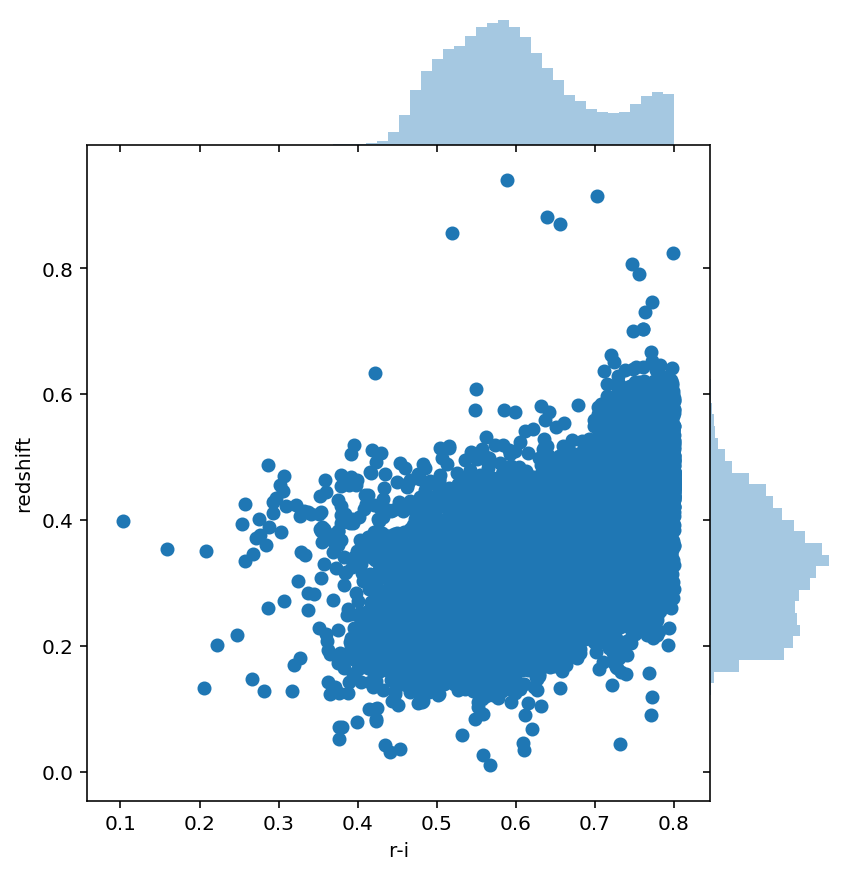

In [21]:
df = load_teddy('A')
sns.jointplot(df.u - df.g, df.redshift, space=0).set_axis_labels('u-g', 'redshift');
sns.jointplot(df.r - df.i, df.redshift, space=0).set_axis_labels('r-i', 'redshift');

### Study off-diagonal correlation to observational errors

It is hypothesized there is some off-diagonal correlation to observational errors. We can look at this with `tfp.stats.correlation`. But what to do with this knowledge?

teddy
mean obs: array([21.88279021, 20.15431506, 18.59003461, 17.98919609, 17.62236915])
mean ratio: array([1.72847515, 1.56428046, 0.60083851, 0.36682695])
mean err: array([0.37141226, 0.07560302, 0.0659287 , 0.07578225, 0.10744411])


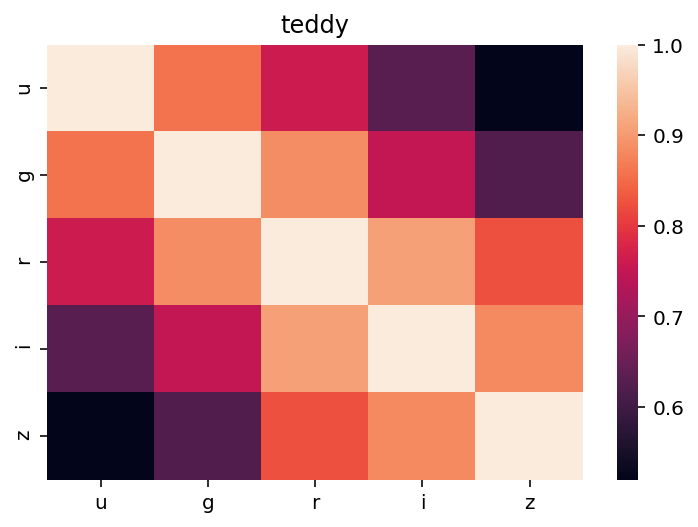

happy
mean obs: array([22.08893134, 20.2363369 , 18.911176  , 18.2244778 , 17.86534756])
mean ratio: array([1.85259444, 1.3251609 , 0.6866982 , 0.35913024])
mean err: array([0.48902923, 0.12920042, 0.09346865, 0.09414047, 0.14099111])


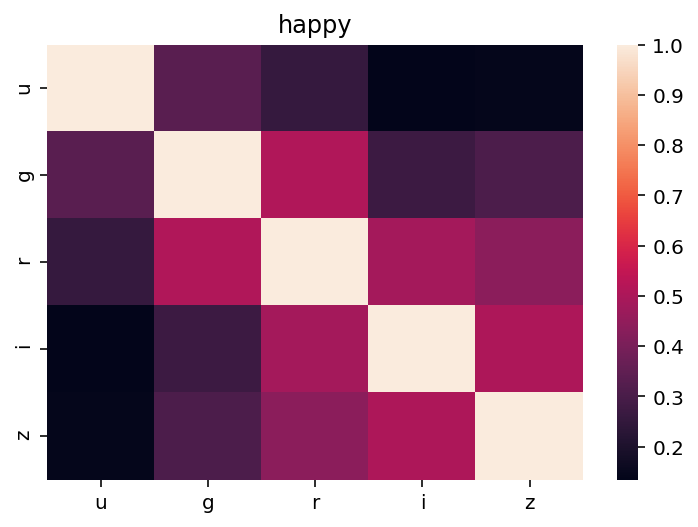

In [22]:
for name, df in ('teddy', load_teddy('A')), ('happy', load_happy('A')):
  print(name)
  obsv = tf.stack([df.u,    df.g,    df.r,    df.i,    df.z], axis=-1)
  print('mean obs:', repr(np.mean(obsv, axis=0)))
  log_ratio = obsv[..., :-1] - obsv[..., 1:]
  print('mean ratio:', repr(np.mean(log_ratio, axis=0)))
  errs = tf.stack([df.uErr, df.gErr, df.rErr, df.iErr, df.zErr], axis=-1)
  print('mean err:', repr(np.mean(errs, axis=0)))
  plt.title(name)
  sns.heatmap(tfp.stats.correlation(errs).numpy(), xticklabels='ugriz', yticklabels='ugriz'); plt.show()
  # sns.heatmap(tfp.stats.correlation(tf.exp(errs)).numpy(), xticklabels='ugriz', yticklabels='ugriz'); plt.show()